<b>• DOMAIN:</b> Semiconductor manufacturing process

<b>• CONTEXT: </b>A complex modern semiconductor manufacturing process is normally under constant surveillance via the monitoring of signals/
variables collected from sensors and or process measurement points. However, not all of these signals are equally valuable in a specific 
monitoring system. The measured signals contain a combination of useful information, irrelevant information as well as noise. Engineers 
typically have a much larger number of signals than are actually required. If we consider each type of signal as a feature, then feature 
selection may be applied to identify the most relevant signals. The Process Engineers may then use these signals to determine key factors 
contributing to yield excursions downstream in the process. This will enable an increase in process throughput, decreased time to learning 
and reduce the per unit production costs. These signals can be used as features to predict the yield type. And by analysing and trying out 
different combinations of features, essential signals that are impacting the yield type can be identified

<b>• DATA DESCRIPTION:</b> sensor-data.csv : (1567, 592)
The data consists of 1567 examples each with 591 features. 
The dataset presented in this case represents a selection of such features where each example represents a single production entity with 
associated measured features and the labels represent a simple pass/fail yield for in house line testing. Target column “ –1” corresponds to 
a pass and “1” corresponds to a fail and the data time stamp is for that specific test point

<b>• PROJECT OBJECTIVE: </b>We will build a classifier to predict the Pass/Fail yield of a particular process entity and analyse whether all the 
features are required to build the model or not

## Steps and tasks:

In [1]:
#!pip install imblearn

### 1. Import and explore the data.

In [113]:
# importing all the required packages
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import time
from scipy.stats import f_oneway
from scipy.stats import chi2_contingency
from sklearn.preprocessing import OneHotEncoder,LabelEncoder,MinMaxScaler
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import classification_report,accuracy_score,recall_score,f1_score,precision_score
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.feature_selection import VarianceThreshold


from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier

import warnings
warnings.filterwarnings("ignore")

from imblearn.over_sampling import SMOTE
import pickle

%matplotlib inline

plt.rcParams['figure.figsize'] = (11,8)

In [3]:
#importing dataset
data = pd.read_csv("D:/Datasets/FMT/signal-data.csv")

In [4]:
data.head()

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1


In [5]:
data.shape

(1567, 592)

### 2. Data cleansing:

In [6]:
# Missing value treatment.
null_df = pd.DataFrame(data.isnull().sum().sort_values(ascending=False))
drop_columns = list(null_df[null_df[0] >= 200].index)

#### we will drop all the columns where null values are greater than 200

In [7]:
data1 = data.drop(drop_columns,axis = 1)


In [8]:
def change_rarget_values(x):
    if x  == -1:
        return 0
    else:
        return x
    
data1['Pass/Fail'] = data1['Pass/Fail'].apply(lambda x : change_rarget_values(x))

In [9]:
data1.head()

,Time,0,1,2,3,4,5,6,7,8,...,577,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,14.9509,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,0
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,10.9003,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,0
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,9.2721,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,8.5831,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,0
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,10.9698,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,0


#### we have removed 52 columnes which having null count more than two hunderd

In [10]:
# now we will use simple imputer to fill the missing values
from sklearn.impute import SimpleImputer

In [13]:
imputer = SimpleImputer(missing_values=np.nan, strategy='median')
scaler = MinMaxScaler()
model = RandomForestClassifier()

In [14]:
X = data1.drop(['Pass/Fail','Time'],axis =1)
y = data1['Pass/Fail']

In [15]:
X_imputed = pd.DataFrame(imputer.fit_transform(X),columns=X.columns)
X_imputed.dropna()
X_imputed.head()

,0,1,2,3,4,5,6,7,8,9,...,576,577,582,583,584,585,586,587,588,589
0,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,0.0162,...,1.6765,14.9509,0.5005,0.0118,0.0035,2.3630,0.0205,0.0148,0.0046,71.9005
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,-0.0005,...,1.1065,10.9003,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045
2,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,0.0041,...,2.0952,9.2721,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602
3,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,-0.0124,...,1.7585,8.5831,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432
4,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,-0.0031,...,1.6597,10.9698,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432


In [16]:
X_imputed.columns

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '576', '577', '582', '583', '584', '585', '586', '587', '588', '589'],
      dtype='object', length=538)

In [17]:
print('Values counts for tatrget variable : \n',y.value_counts())

Values counts for tatrget variable : 
 0    1463
1     104
Name: Pass/Fail, dtype: int64


### Note : The dataset is imbalance So , we need to balance it

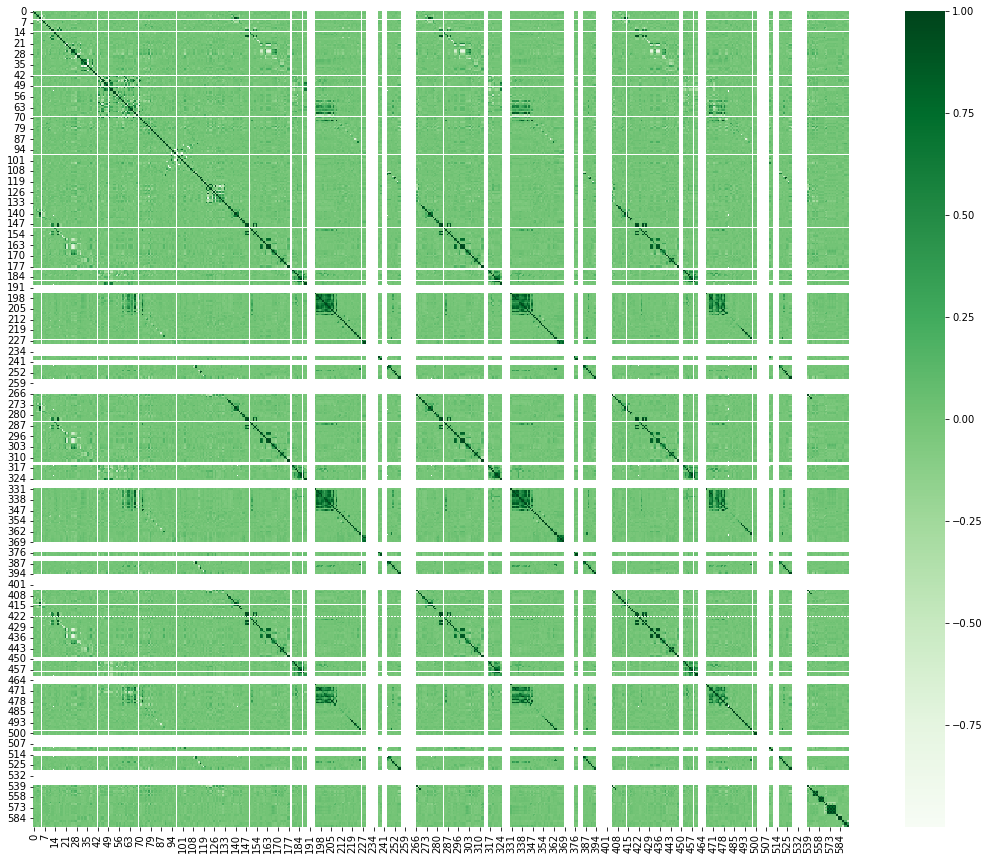

In [18]:
#let us see the correllation betwwen vairables  and we will drop correletaled 
plt.figure(figsize = (20,15))
corr = X_imputed.corr()
#annot = False
sns.heatmap(corr,square = True,cmap = 'Greens',linecolor= 'black')
plt.show()

In [19]:
print(X_imputed.corr().columns[:])

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '576', '577', '582', '583', '584', '585', '586', '587', '588', '589'],
      dtype='object', length=538)


#### Note : We can see amny columns are co related to each other so we will remove them 

In [20]:
#Remove the highly collinear features from data
def remove_collinear_features(x, threshold):
    '''
    Objective:
        Remove collinear features in a dataframe with a correlation coefficient
        greater than the threshold. Removing collinear features can help a model 
        to generalize and improves the interpretability of the model.

    Inputs: 
        x: features dataframe
        threshold: features with correlations greater than this value are removed

    Output: 
        dataframe that contains only the non-highly-collinear features
    '''

    # Calculate the correlation matrix
    corr_matrix = x.corr()
    iters = range(len(corr_matrix.columns) - 1)
    drop_cols = []
     # Iterate through the correlation matrix and compare correlations
    for i in iters:
        for j in range(i+1):
            item = corr_matrix.iloc[j:(j+1), (i+1):(i+2)]
            col = item.columns
            row = item.index
            val = abs(item.values)

            # If correlation exceeds the threshold
            if val >= threshold:
                # Print the correlated features and the correlation value
               # print(col.values[0], "|", row.values[0], "|", round(val[0][0], 2))
                drop_cols.append(col.values[0])

    # Drop one of each pair of correlated columns
    drops = set(drop_cols)
    x = x.drop(columns=drops)

    return x


In [21]:
X_imputed2 = remove_collinear_features(X_imputed,0.70)

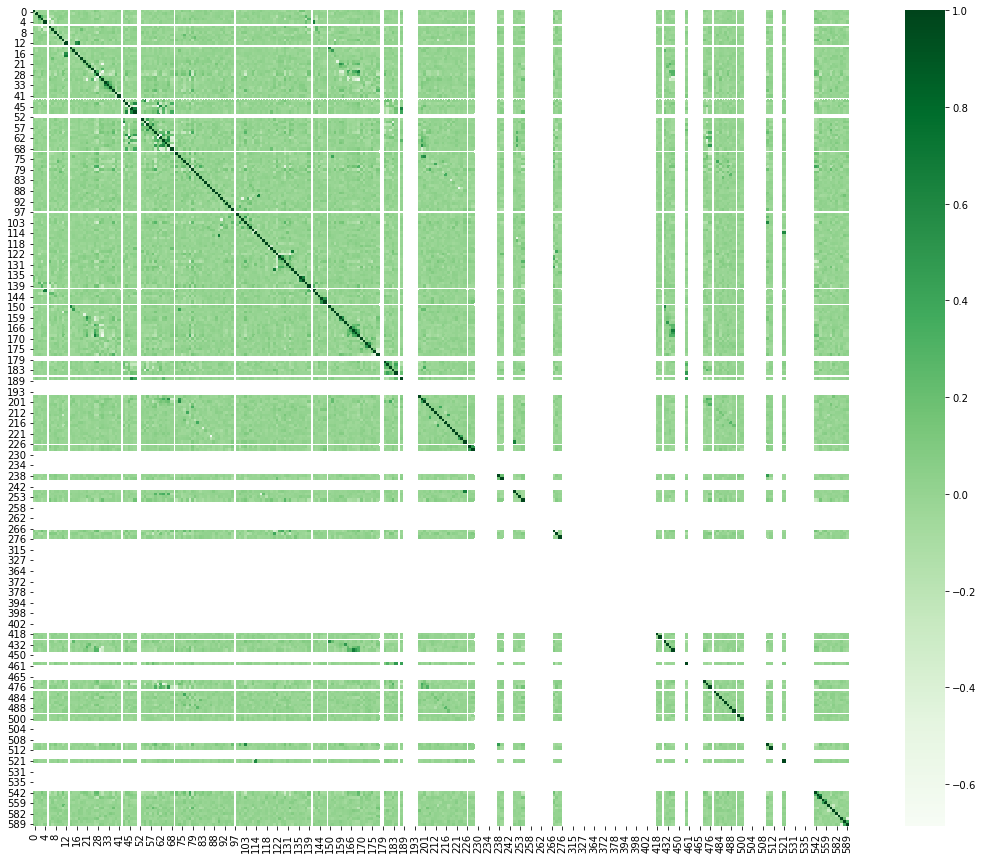

In [22]:
#let us see the correllation betwwen vairables  and we will drop correletaled 
plt.figure(figsize = (20,15))
corr = X_imputed2.corr()
#annot = False
sns.heatmap(corr,square = True,cmap = 'Greens')
plt.show()

In [23]:
print(X_imputed.shape)
print(X_imputed2.shape)

(1567, 538)
(1567, 309)


### Now we were able have 309 columns and 1567 roes

### 3.Data analysis & visualisation:

In [24]:
num_cols = X_imputed2.select_dtypes(include = [np.number]).columns
cat_cols = X_imputed2.select_dtypes(exclude = [np.number]).columns

In [25]:
num_cols

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '558', '559', '570', '571', '572', '582', '583', '586', '587', '589'],
      dtype='object', length=309)

In [26]:
cat_cols

Index([], dtype='object')

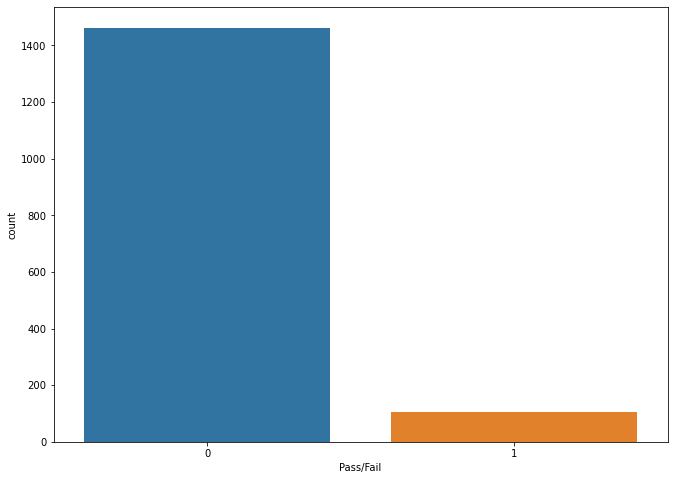

In [27]:
sns.countplot(y)
plt.show()

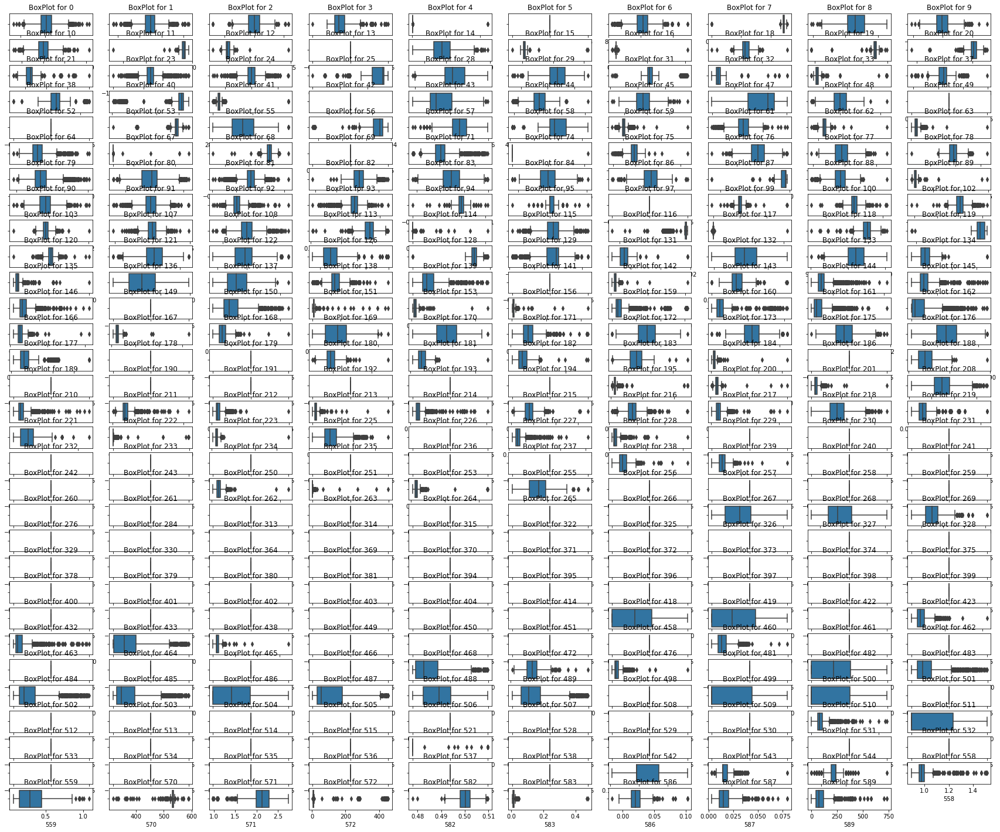

In [28]:
plt.figure(figsize=(30,25))
for i,c in enumerate(num_cols):
    plt.subplot(31,10,i+1)
    sns.boxplot(x = c ,data = X_imputed2)
    plt.title('BoxPlot for '+c)
plt.tight_layout()
plt.show()

In [29]:
# now we will drop all that columnse having variance less than threshold
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
X_norm =  pd.DataFrame(normalizer.transform(X_imputed2), columns = X_imputed2.columns)
X_norm.shape

(1567, 309)

In [30]:
selector = VarianceThreshold()
selector.fit(X_norm)
mask = selector.get_support()
columns = X_norm.columns
selected_cols = columns[mask]
n_features2 = len(selected_cols)
print(f'remaining features: {n_features2}')

remaining features: 197


In [31]:
X_var = pd.DataFrame(selector.transform(X_imputed2), columns = selected_cols)
X_var.head()

,0,1,2,3,4,5,6,7,8,9,...,558,559,570,571,572,582,583,586,587,589
0,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,0.0162,...,1.0344,0.4385,533.8500,2.1113,8.95,0.5005,0.0118,0.0205,0.0148,71.9005
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,-0.0005,...,0.9634,0.1745,535.0164,2.4335,5.92,0.5019,0.0223,0.0096,0.0201,208.2045
2,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,0.0041,...,1.5021,0.3718,535.0245,2.0293,11.21,0.4958,0.0157,0.0584,0.0484,82.8602
3,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,-0.0124,...,1.1613,0.7288,530.5682,2.0253,9.33,0.4990,0.0103,0.0202,0.0149,73.8432
4,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,-0.0031,...,0.9778,0.2156,532.0155,2.0275,8.83,0.4800,0.4766,0.0202,0.0149,73.8432


In [32]:
# now we will see which have More correleation with Target and remove all non corelated 
X_var_corr = X_var
X_var_corr['Target'] = y
var_corr = X_var_corr.corr()
no_corr_columns = var_corr.loc[['Target'],abs(var_corr['Target'] < 0.05)].columns
#var_corr[var_corr['Target'] < 0.05]
X_var_corr = X_var_corr.drop(columns = no_corr_columns).drop(columns = ['Target'])


In [33]:
no_corr_columns

Index(['0', '1', '2', '3', '4', '6', '7', '8', '9', '10',
       ...
       '558', '559', '570', '571', '572', '582', '583', '586', '587', '589'],
      dtype='object', length=166)

In [34]:
X_var_corr

,5,21,32,33,38,42,49,56,58,59,...,133,159,160,166,183,200,210,460,510,511
0,100.0,-5419.00,83.3971,9.5126,86.9555,70.0,1.0,0.9317,4.7057,-1.7264,...,1000.7263,1017.0,967.0,2.0,16.713,10.30,0.0772,29.9394,64.6707,0.0000
1,100.0,-5441.50,84.9052,9.7997,87.5241,70.0,1.0,0.9324,4.6820,0.8073,...,998.1081,568.0,59.0,2.2,16.358,8.02,0.0566,40.4475,141.4365,0.0000
2,100.0,-5447.75,84.7569,8.6590,84.7327,70.0,1.0,0.9139,4.5873,23.8245,...,998.4440,562.0,788.0,2.1,22.912,16.73,0.0339,32.3594,240.7767,244.2748
3,100.0,-5468.25,84.9105,8.6789,86.6867,70.0,1.0,0.9139,4.5873,24.3791,...,980.4510,859.0,355.0,1.7,22.562,13.56,0.1248,27.6824,113.5593,0.0000
4,100.0,-5476.25,86.3269,8.7677,86.1468,70.0,1.0,0.9298,4.6414,-12.2945,...,993.1274,699.0,283.0,3.9,37.715,19.77,0.0915,30.8924,148.0663,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,100.0,-5418.75,83.8405,8.7164,86.3672,70.0,1.0,0.9204,4.4941,2.8182,...,997.7594,1280.0,334.0,5.9,14.104,12.71,0.0797,52.6790,53.1915,235.7895
1563,100.0,-6408.75,84.0623,8.9607,86.4051,70.0,1.0,0.9255,4.5305,-3.3555,...,1015.7622,504.0,94.0,2.7,30.347,24.47,0.0797,18.5401,29.4372,700.0000
1564,100.0,-5153.25,85.8638,8.1728,86.3506,70.0,1.0,0.9353,4.6118,1.1664,...,1004.0500,1178.0,542.0,3.2,20.963,19.37,0.0797,37.7546,54.8330,0.0000
1565,100.0,-5271.75,84.5602,9.1930,86.3130,70.0,1.0,0.9207,4.5509,4.4682,...,999.4826,1740.0,252.0,2.2,13.879,9.49,0.0797,29.2827,78.4993,456.4103


In [35]:
#using pipeline 
from sklearn.pipeline import Pipeline

p_line = Pipeline([('imputer',SimpleImputer(missing_values=np.nan, strategy='median')),
                   ('scaler',MinMaxScaler()),('model',RandomForestClassifier())])

p_line.fit(X, y)

Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                ('scaler', MinMaxScaler()),
                ('model', RandomForestClassifier())])

In [36]:
model = RandomForestClassifier()
X_scaled = scaler.fit_transform(X_var_corr)
model.fit(X_scaled,y)

imp_features_df = pd.DataFrame(model.feature_importances_,index = X_var_corr.columns,columns = ['Values'])
imp_features_df = imp_features_df.sort_values(by='Values',ascending=False)
imp_features_df.sort_values(by = 'Values',ascending= False)


,Values
59,0.066875
64,0.060815
166,0.050538
21,0.050471
210,0.047304
63,0.044691
38,0.044393
103,0.043619
510,0.042113
200,0.040102


In [37]:
model = RandomForestClassifier()
X_scaled_all = scaler.fit_transform(X_imputed)
model.fit(X_scaled_all,y)

imp_features_df_all = pd.DataFrame(model.feature_importances_,index = X.columns,columns = ['Values'])
imp_features_df_all = imp_features_df_all.sort_values(by='Values',ascending=False)
imp_features_df_all.sort_values(by = 'Values',ascending= False)

,Values
59,0.012984
64,0.012477
153,0.009375
65,0.008800
348,0.007168
...,...
512,0.000000
513,0.000000
514,0.000000
515,0.000000


In [38]:
(imp_features_df_all['Values'] <= 0.000).sum()

122

In [39]:
X_train,X_test,y_train,y_test = train_test_split(X_scaled_all,y,test_size = 0.2,random_state = 1)

In [40]:
from sklearn.linear_model import RidgeClassifier
for alpha in [0.1,0.2,0.3,0.4,0.5,1.0]:
    ridge = RidgeClassifier(alpha= alpha)
    ridge.fit(X_train,y_train)
    train_score = ridge.score(X_train,y_train)
    test_score = ridge.score(X_test,y_test)
    
    print(f'{alpha} : {train_score}')
    print(f'{alpha} : {test_score}')
    print('*'*30)
    

0.1 : 0.945730247406225
0.1 : 0.9267515923566879
******************************
0.2 : 0.9441340782122905
0.2 : 0.9299363057324841
******************************
0.3 : 0.9441340782122905
0.3 : 0.9331210191082803
******************************
0.4 : 0.9433359936153233
0.4 : 0.9331210191082803
******************************
0.5 : 0.942537909018356
0.5 : 0.9331210191082803
******************************
1.0 : 0.9409417398244214
1.0 : 0.9363057324840764
******************************


In [41]:
ridge = RidgeClassifier(alpha= 1.0)
ridge.fit(X_train,y_train)
(np.round(ridge.coef_,2) == 0.0).sum()

128

In [42]:
# with only 32 cols
X_train,X_test,y_train,y_test = train_test_split(X_var_corr,y,test_size = 0.2,random_state = 1)
for alpha in [0.1,0.2,0.3,0.4,0.5,1.0]:
    ridge = RidgeClassifier(alpha= alpha)
    ridge.fit(X_train,y_train)
    train_score = ridge.score(X_train,y_train)
    test_score = ridge.score(X_test,y_test)
    
    print(f'{alpha} : {train_score}')
    print(f'{alpha} : {test_score}')
    print('*'*30)
    

0.1 : 0.9329608938547486
0.1 : 0.9331210191082803
******************************
0.2 : 0.9329608938547486
0.2 : 0.9331210191082803
******************************
0.3 : 0.9329608938547486
0.3 : 0.9331210191082803
******************************
0.4 : 0.9329608938547486
0.4 : 0.9331210191082803
******************************
0.5 : 0.9329608938547486
0.5 : 0.9331210191082803
******************************
1.0 : 0.9337589784517158
1.0 : 0.9331210191082803
******************************


In [43]:
ridge = RidgeClassifier(alpha= 1.0,)
ridge.fit(X_train,y_train)
print(np.round(ridge.coef_[0],3))
coeff_dict = {}
for col,coeff in zip(X_var_corr.columns,ridge.coef_[0]):
    coeff_dict[col] = coeff

[ 0.     0.     0.001  0.009 -0.061  0.     0.     0.026  0.136  0.011
 -0.007  0.015  0.    -0.453 -0.     0.01   0.037  0.087  0.472  0.092
  0.029 -0.001 -0.     0.     0.035  0.002  0.004  0.412  0.002  0.001
  0.   ]


In [44]:
ridge_drop_cols= []
for key in coeff_dict.keys():
    if coeff_dict[key] == 0.:
        ridge_drop_cols.append(key)
        
ridge_drop_cols.append('114')

### NOTE : this Four are not important for us we will drop them ['5', '42', '49', '69']

In [45]:
X_var_corr = X_var_corr.drop(columns = ridge_drop_cols)

In [46]:
model = RandomForestClassifier()
X_scaled = scaler.fit_transform(X_var_corr)
model.fit(X_scaled,y)

imp_features_df = pd.DataFrame(model.feature_importances_,index = X_var_corr.columns,columns = ['Values'])
imp_features_df = imp_features_df.sort_values(by='Values',ascending=False)
imp_features_df.sort_values(by = 'Values',ascending= False)

,Values
64,0.067541
59,0.065978
21,0.050146
166,0.049623
103,0.046548
38,0.046491
121,0.044358
63,0.042473
210,0.042149
160,0.040386


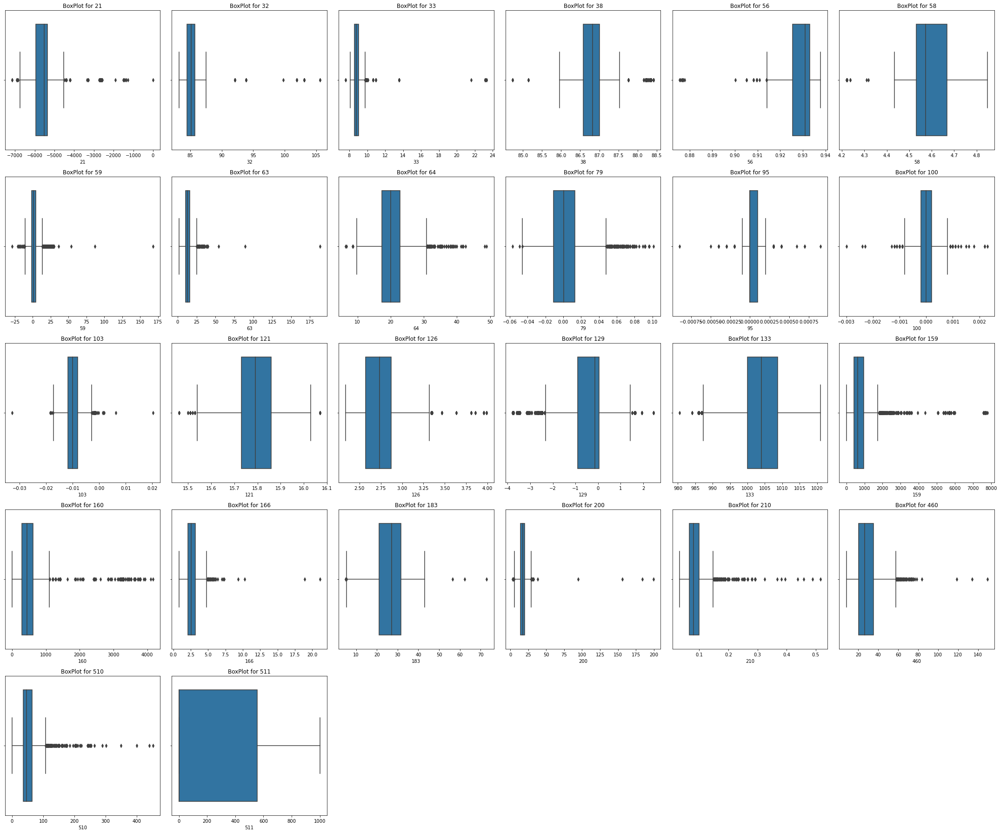

In [47]:
plt.figure(figsize=(30,25))
for i,c in enumerate(X_var_corr.columns):
    plt.subplot(5,6,i+1)
    sns.boxplot(x = c ,data = X_imputed2)
    plt.title('BoxPlot for '+c)
plt.tight_layout()
plt.show()

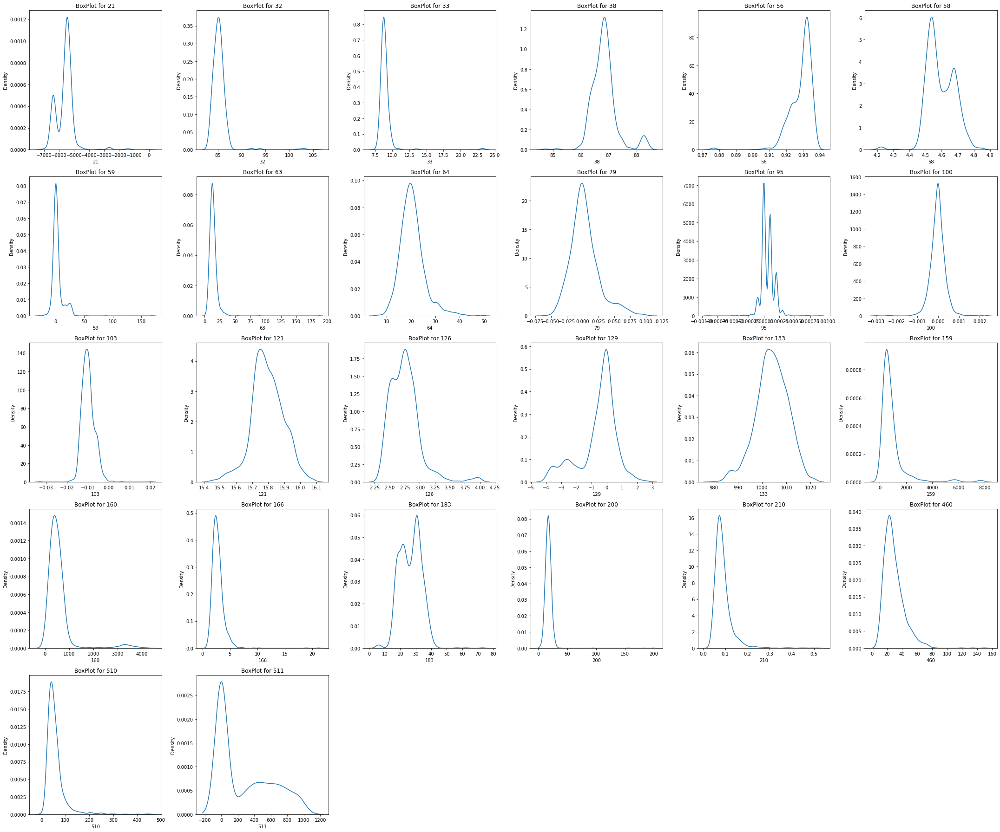

In [48]:
plt.figure(figsize=(30,25))
for i,c in enumerate(X_var_corr.columns):
    plt.subplot(5,6,i+1)
    sns.kdeplot(x = c ,data = X_imputed2)
    plt.title('BoxPlot for '+c)
plt.tight_layout()
plt.show()

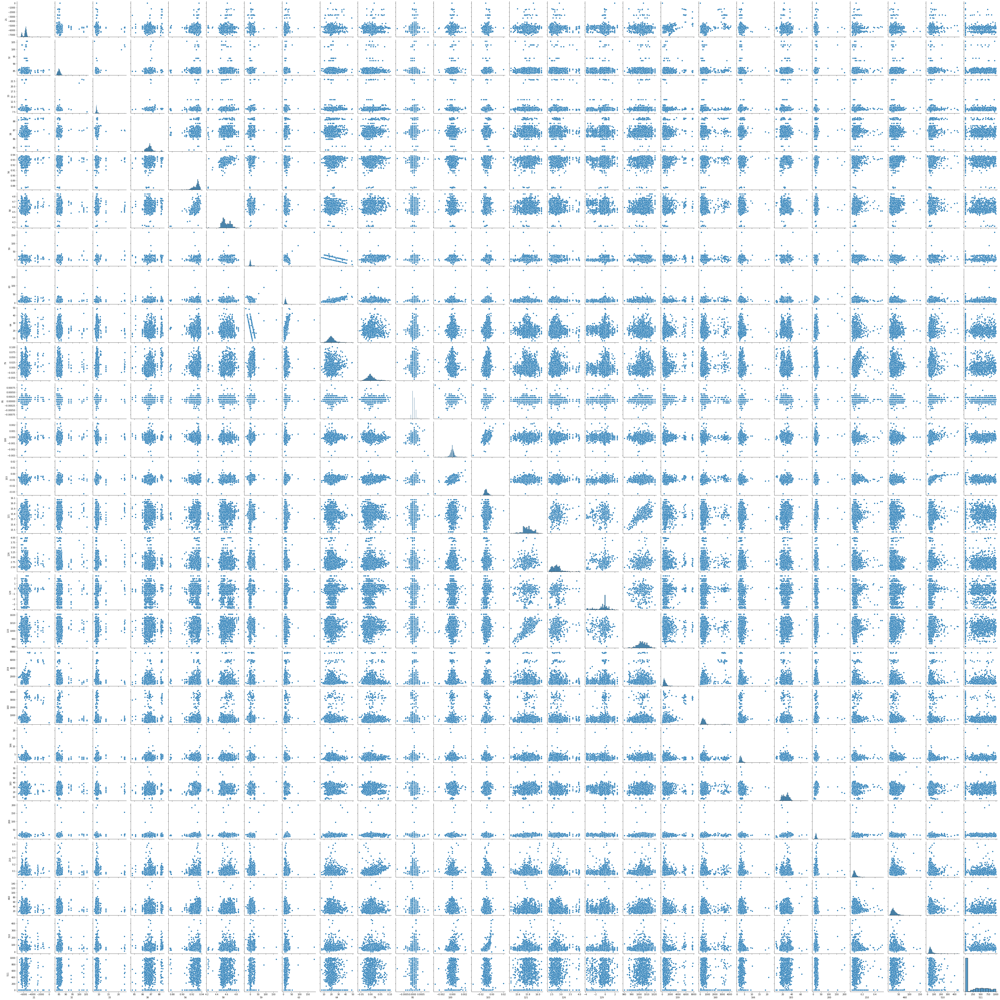

In [49]:
sns.pairplot(X_var_corr)
plt.show()

In [103]:
X_var_corr_target = X_var_corr.copy()
X_var_corr_target['Target'] = y

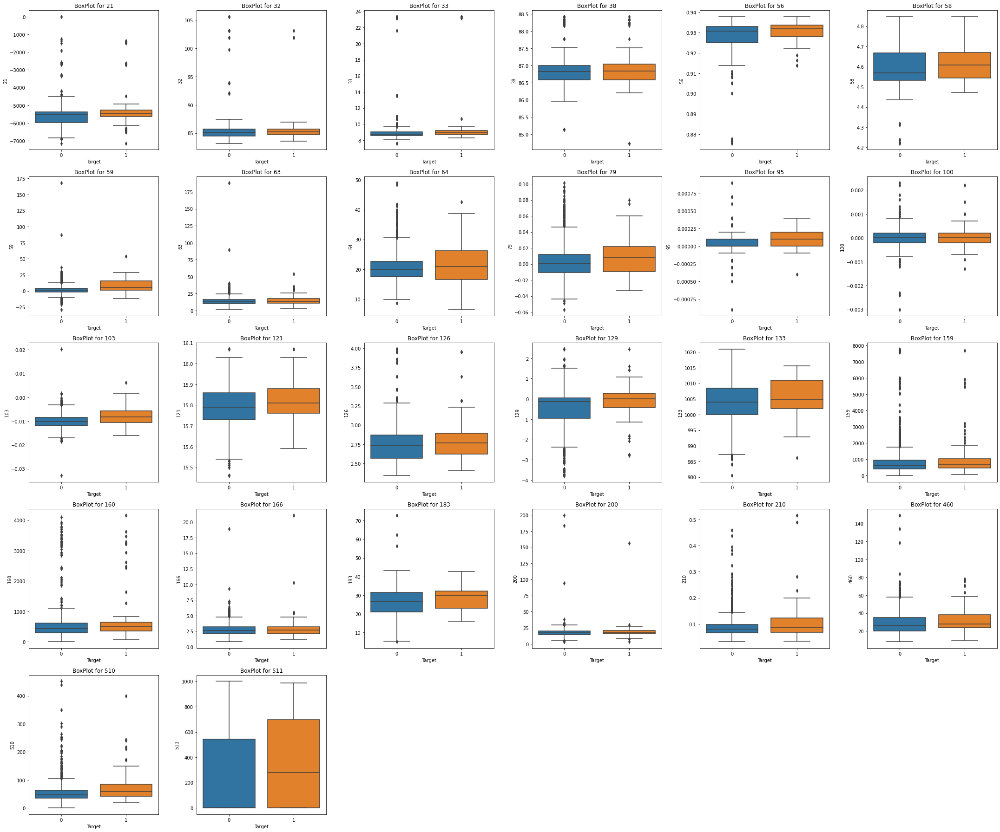

In [105]:
plt.figure(figsize=(30,25))
for i,c in enumerate(X_var_corr.columns):
    plt.subplot(5,6,i+1)
    sns.boxplot(y = c ,x = 'Target',data = X_var_corr_target)
    plt.title('BoxPlot for '+c)
plt.tight_layout()
plt.show()

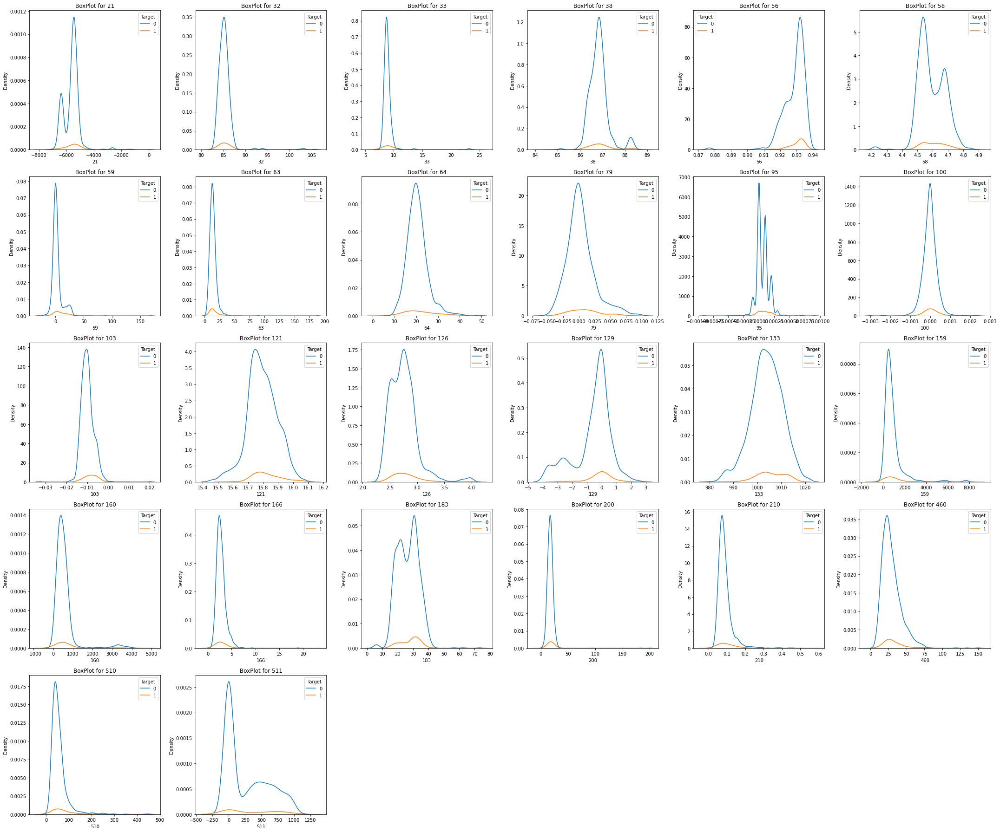

In [108]:
plt.figure(figsize=(30,25))
for i,c in enumerate(X_var_corr.columns):
    plt.subplot(5,6,i+1)
    sns.kdeplot(x = c ,hue = 'Target',data = X_var_corr_target)
    plt.title('BoxPlot for '+c)
plt.tight_layout()
plt.show()

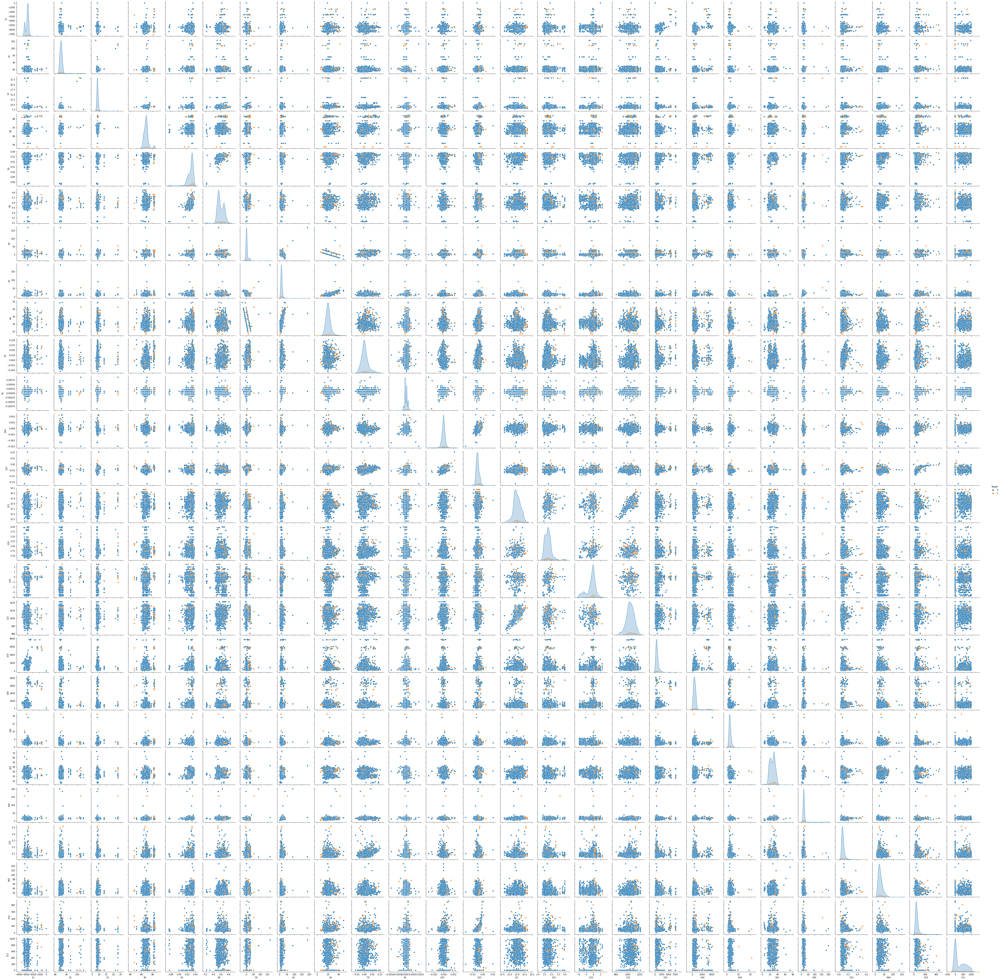

In [112]:
sns.pairplot(data = X_var_corr_target,hue = 'Target')
plt.show()

In [51]:
X_train,X_test,y_train,y_test = train_test_split(X_var_corr,y,test_size = 0.2,random_state = 1)

In [52]:
lr = LogisticRegression()
svc = SVC(probability=True)
rf = RandomForestClassifier()
gnb = GaussianNB()
dt = DecisionTreeClassifier(max_depth = 8)
ab = AdaBoostClassifier(dt)
bc = BaggingClassifier(dt)
gb = GradientBoostingClassifier()
xgb = XGBClassifier()
cat = CatBoostClassifier()
lgbm = LGBMClassifier()

In [53]:
def models_info(model,X_train,X_test,y_train,y_test):
    start = time.time()
    
    model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    
    train_accuracy = model.score(X_train,y_train)
    test_accuracy = model.score(X_test,y_test)
    f1 = f1_score(y_test,y_pred)
    recall = recall_score(y_test,y_pred)
    precision = precision_score(y_test,y_pred)
    
    end = time.time() 
    duration = end - start 
    
    return train_accuracy,test_accuracy,f1, recall, recall,duration,y_pred

In [54]:
models = [lr,svc,rf,gnb,dt,ab,bc,gb,xgb,cat,lgbm]
model_names = ['Logistic Regression','SVM','RandomForest','Naive Bayes','Decision Tree','Adaboost','BaggingClassifier',
              'gradientBoost','XgBoost','CatClassifier','lightGBM']

result_labels = ['train_accuracy','test_accuracy','f1','recall',' precision','Duration']

result = {}

for model,name in zip(models,model_names):
    result[name] = list(models_info(model,X_train,X_test,y_train,y_test)[:-1])

[09:31:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.011344
0:	learn: 0.6792918	total: 168ms	remaining: 2m 48s
1:	learn: 0.6653310	total: 174ms	remaining: 1m 26s
2:	learn: 0.6521124	total: 181ms	remaining: 1m
3:	learn: 0.6392901	total: 188ms	remaining: 46.7s
4:	learn: 0.6268242	total: 194ms	remaining: 38.6s
5:	learn: 0.6143187	total: 199ms	remaining: 33s
6:	learn: 0.6025520	total: 203ms	remaining: 28.8s
7:	learn: 0.5921404	total: 206ms	remaining: 25.5s
8:	learn: 0.5805750	total: 210ms	remaining: 23.1s
9:	learn: 0.5701079	total: 213ms	remaining: 21.1s
10:	learn: 0.5594711	total: 216ms	remaining: 19.4s
11:	learn: 0.5486482	total: 219ms	remaining: 18s
12:	learn: 0.5389003	total: 222ms	remaining: 16.9s
13:	learn: 0

181:	learn: 0.1708616	total: 705ms	remaining: 3.17s
182:	learn: 0.1706104	total: 708ms	remaining: 3.16s
183:	learn: 0.1700754	total: 711ms	remaining: 3.15s
184:	learn: 0.1695575	total: 714ms	remaining: 3.15s
185:	learn: 0.1692591	total: 717ms	remaining: 3.14s
186:	learn: 0.1689512	total: 721ms	remaining: 3.13s
187:	learn: 0.1683987	total: 724ms	remaining: 3.13s
188:	learn: 0.1680772	total: 727ms	remaining: 3.12s
189:	learn: 0.1676436	total: 730ms	remaining: 3.11s
190:	learn: 0.1674265	total: 733ms	remaining: 3.1s
191:	learn: 0.1669681	total: 736ms	remaining: 3.1s
192:	learn: 0.1664117	total: 738ms	remaining: 3.09s
193:	learn: 0.1660689	total: 741ms	remaining: 3.08s
194:	learn: 0.1656863	total: 744ms	remaining: 3.07s
195:	learn: 0.1652321	total: 746ms	remaining: 3.06s
196:	learn: 0.1647607	total: 749ms	remaining: 3.05s
197:	learn: 0.1645041	total: 751ms	remaining: 3.04s
198:	learn: 0.1640801	total: 754ms	remaining: 3.03s
199:	learn: 0.1638039	total: 757ms	remaining: 3.03s
200:	learn: 0.

366:	learn: 0.1259090	total: 1.23s	remaining: 2.13s
367:	learn: 0.1257109	total: 1.24s	remaining: 2.12s
368:	learn: 0.1255535	total: 1.24s	remaining: 2.12s
369:	learn: 0.1254070	total: 1.24s	remaining: 2.11s
370:	learn: 0.1251379	total: 1.24s	remaining: 2.11s
371:	learn: 0.1249070	total: 1.25s	remaining: 2.11s
372:	learn: 0.1247439	total: 1.25s	remaining: 2.1s
373:	learn: 0.1246140	total: 1.25s	remaining: 2.1s
374:	learn: 0.1242989	total: 1.26s	remaining: 2.09s
375:	learn: 0.1239680	total: 1.26s	remaining: 2.09s
376:	learn: 0.1237916	total: 1.26s	remaining: 2.09s
377:	learn: 0.1233497	total: 1.26s	remaining: 2.08s
378:	learn: 0.1231974	total: 1.27s	remaining: 2.08s
379:	learn: 0.1229326	total: 1.27s	remaining: 2.07s
380:	learn: 0.1226755	total: 1.27s	remaining: 2.07s
381:	learn: 0.1226204	total: 1.27s	remaining: 2.06s
382:	learn: 0.1225070	total: 1.28s	remaining: 2.06s
383:	learn: 0.1224136	total: 1.28s	remaining: 2.05s
384:	learn: 0.1220224	total: 1.28s	remaining: 2.05s
385:	learn: 0.

557:	learn: 0.0938347	total: 1.77s	remaining: 1.4s
558:	learn: 0.0936350	total: 1.77s	remaining: 1.4s
559:	learn: 0.0933731	total: 1.77s	remaining: 1.39s
560:	learn: 0.0931932	total: 1.77s	remaining: 1.39s
561:	learn: 0.0930327	total: 1.78s	remaining: 1.39s
562:	learn: 0.0929190	total: 1.78s	remaining: 1.38s
563:	learn: 0.0927901	total: 1.78s	remaining: 1.38s
564:	learn: 0.0927359	total: 1.79s	remaining: 1.38s
565:	learn: 0.0926938	total: 1.79s	remaining: 1.37s
566:	learn: 0.0925954	total: 1.79s	remaining: 1.37s
567:	learn: 0.0924818	total: 1.8s	remaining: 1.37s
568:	learn: 0.0924514	total: 1.8s	remaining: 1.36s
569:	learn: 0.0923455	total: 1.8s	remaining: 1.36s
570:	learn: 0.0922014	total: 1.8s	remaining: 1.35s
571:	learn: 0.0920990	total: 1.81s	remaining: 1.35s
572:	learn: 0.0919078	total: 1.82s	remaining: 1.35s
573:	learn: 0.0917144	total: 1.82s	remaining: 1.35s
574:	learn: 0.0916071	total: 1.82s	remaining: 1.35s
575:	learn: 0.0914963	total: 1.82s	remaining: 1.34s
576:	learn: 0.0913

749:	learn: 0.0754677	total: 2.29s	remaining: 764ms
750:	learn: 0.0753876	total: 2.29s	remaining: 761ms
751:	learn: 0.0752509	total: 2.3s	remaining: 758ms
752:	learn: 0.0751776	total: 2.3s	remaining: 754ms
753:	learn: 0.0750864	total: 2.3s	remaining: 751ms
754:	learn: 0.0749478	total: 2.31s	remaining: 748ms
755:	learn: 0.0748938	total: 2.31s	remaining: 745ms
756:	learn: 0.0747835	total: 2.31s	remaining: 742ms
757:	learn: 0.0747333	total: 2.31s	remaining: 739ms
758:	learn: 0.0746136	total: 2.32s	remaining: 736ms
759:	learn: 0.0744771	total: 2.32s	remaining: 733ms
760:	learn: 0.0743258	total: 2.32s	remaining: 729ms
761:	learn: 0.0742848	total: 2.33s	remaining: 726ms
762:	learn: 0.0742218	total: 2.33s	remaining: 723ms
763:	learn: 0.0740811	total: 2.33s	remaining: 720ms
764:	learn: 0.0739414	total: 2.33s	remaining: 717ms
765:	learn: 0.0737677	total: 2.33s	remaining: 714ms
766:	learn: 0.0736284	total: 2.34s	remaining: 710ms
767:	learn: 0.0735685	total: 2.34s	remaining: 707ms
768:	learn: 0.0

945:	learn: 0.0599586	total: 2.83s	remaining: 161ms
946:	learn: 0.0598271	total: 2.83s	remaining: 158ms
947:	learn: 0.0597068	total: 2.83s	remaining: 155ms
948:	learn: 0.0595494	total: 2.83s	remaining: 152ms
949:	learn: 0.0594250	total: 2.84s	remaining: 149ms
950:	learn: 0.0593981	total: 2.84s	remaining: 146ms
951:	learn: 0.0593378	total: 2.87s	remaining: 145ms
952:	learn: 0.0592572	total: 2.87s	remaining: 142ms
953:	learn: 0.0592359	total: 2.87s	remaining: 139ms
954:	learn: 0.0591568	total: 2.88s	remaining: 136ms
955:	learn: 0.0591479	total: 2.88s	remaining: 133ms
956:	learn: 0.0589883	total: 2.88s	remaining: 130ms
957:	learn: 0.0589439	total: 2.89s	remaining: 127ms
958:	learn: 0.0588363	total: 2.89s	remaining: 124ms
959:	learn: 0.0587255	total: 2.89s	remaining: 121ms
960:	learn: 0.0586683	total: 2.9s	remaining: 118ms
961:	learn: 0.0586008	total: 2.9s	remaining: 115ms
962:	learn: 0.0585645	total: 2.9s	remaining: 112ms
963:	learn: 0.0585217	total: 2.91s	remaining: 109ms
964:	learn: 0.0

In [55]:
default_result_df = pd.DataFrame(result.values(),columns = result_labels,index = result.keys() )
default_result_df

,train_accuracy,test_accuracy,f1,recall,precision,Duration
Logistic Regression,0.930567,0.926752,0.000000,0.00,0.00,0.090695
SVM,0.932961,0.936306,0.000000,0.00,0.00,0.253236
RandomForest,1.000000,0.936306,0.000000,0.00,0.00,1.972989
Naive Bayes,0.901038,0.875796,0.133333,0.15,0.15,0.008512
Decision Tree,0.972067,0.917197,0.071429,0.05,0.05,0.031260
Adaboost,1.000000,0.936306,0.000000,0.00,0.00,1.226619
BaggingClassifier,0.958500,0.933121,0.000000,0.00,0.00,0.172511
gradientBoost,0.976856,0.939490,0.173913,0.10,0.10,0.657778
XgBoost,1.000000,0.929936,0.083333,0.05,0.05,0.214326
CatClassifier,0.987231,0.936306,0.000000,0.00,0.00,3.369587


### NOTE :
1. Accauracy is great but F1 ,recall and precision is very bad 
2. Deafult parameters are not performing good so we need to hypertune

In [61]:
def Hypertuning_Models(X_train,X_test,y_train,y_test):
    #linear Regression
    print('Working with Logistic Regression')
    model = LogisticRegression(random_state = 1,max_iter=1000)
    params = { 'penalty':['l1', 'l2', 'elasticnet','none'],
           'C':[0.0001,0.001,0.01,0.1,1.0],
          'solver':['lbfgs','newton-cg',  'liblinear', 'sag', 'saga']
        }

    gs  = GridSearchCV( estimator = model,param_grid = params,n_jobs = -1, verbose=2,cv = 5)
    gs.fit(X_train,y_train) 
    hlr = gs.best_estimator_
    """
    # 2. SVM
    print('Working with SVM')
    model = SVC(probability=True)
    params = { 'C':[0.001,0.01,0.1,1.0],
    'kernel':['linear', 'poly', 'rbf', 'sigmoid'],
    'degree':[2,3],
    'gamma':[0.001,0.01,0.1,1.0,'scale','auto'],
    
    }
    gs  = GridSearchCV( estimator = model,
                        param_grid = params,n_jobs = -1, verbose=2,cv = 5)

    gs.fit(X_train,y_train)
    hsvc = gs.best_estimator_
    """
    #3. RandomForest
    print('Working with RandomForest')
    model = RandomForestClassifier()
    params = { 'n_estimators':np.arange(10,110,10),
          'criterion':['gini','entropy'],
          'max_depth':[1,2,3,4,5,6,7,8,9,10],
          'min_samples_split':[2,3,4],
          'min_samples_leaf':[1,2]
    
    }
     
    gs  = GridSearchCV( estimator = model,
    param_grid = params,n_jobs = -1, verbose=2,cv = 5)

    gs.fit(X_train,y_train)
    hrf = gs.best_estimator_

    #Decision Tree
    print('Working with Descision Tree')
    model = DecisionTreeClassifier()
    params = {'splitter':['best','random'], 
          'criterion':['gini','entropy'],
          'max_depth':[1,2,3,4,5,6,7,8,9,10],
          'min_samples_split':[2,3,4],
          'min_samples_leaf':[1,2],
          'max_features':['auto', 'sqrt', 'log2']
    }
    gs  = GridSearchCV( estimator = model,
        param_grid = params,n_jobs = -1, verbose=2,cv = 5)

    gs.fit(X_train,y_train)
    hdt = gs.best_estimator_

    #Adaboost
    print('Working with AdaBoost')
    model = AdaBoostClassifier()
    params= {
    'base_estimator':[hdt], 
    'n_estimators':[10,20,30,40,50,60,70,80], 
    'learning_rate':[0.01,0.1,1.0], 
    'algorithm':['SAMME','SAMME.R'],
    }
    gs  = GridSearchCV( estimator = model,
    param_grid = params,n_jobs = -1, verbose=2,cv = 5)

    gs.fit(X_train,y_train)
    hab = gs.best_estimator_


    #Bagging
    print('Working with Bagging Classifier')
    model = BaggingClassifier()
    params = {
    'base_estimator':[hlr,hdt],
    'n_estimators':[10,20,30,40,50,60,70,80]
    }
    gs  = GridSearchCV( estimator = model,
    param_grid = params,n_jobs = -1, verbose=2,cv = 5)

    gs.fit(X_train,y_train)
    hbc = gs.best_estimator_


    #gradientBoosting
    print('Working with Gradient Boosting')
    model = GradientBoostingClassifier()
    params = {
    'loss':['deviance', 'exponential'],
    'criterion':['friedman_mse', 'squared_error', 'mse'],
    'n_estimators':[10,20,30,40,50,60,70,80],
    'learning_rate':[0.01,0.1,1.0],
    'max_depth':[1,2,3,4,5,6,7,8,9,10],
    'min_samples_split':[2,3,4],
    'min_samples_leaf':[1,2],
    'max_features':['auto', 'sqrt', 'log2']
    }
    gs  = GridSearchCV( estimator = model,
        param_grid = params,n_jobs = -1, verbose=2,cv = 5)

    gs.fit(X_train,y_train)
    hgb = gs.best_estimator_


    #XGBoost
    print('Working with XGBOOST')
    model = XGBClassifier(verbosity = 0,use_label_encoder = False)
    params={
     'objective':['binary:logistic','binary:hinge'],
    'n_estimators':[10,20,30,40,50,60,70,80],
    'max_depth':[1,2,3,4,5,6,7,8,9,10],
    'learning_rate':[0.01,0.1,1.0]
    }
    gs  = GridSearchCV( estimator = model,
        param_grid = params,n_jobs = -1, verbose=2,cv = 5)

    gs.fit(X_train,y_train)
    hxgb= gs.best_estimator_


    # CatBoost
    print('Working with CatBoost')
    model = CatBoostClassifier()
    params ={
    'iterations': [10,20,30,40,50,60,70,80],
    'depth':[1,2,3,4,5,6,7,8,9,10],
    'learning_rate':[0.01,0.1,1.0]
    }

    gs  = GridSearchCV( estimator = model,
        param_grid = params,n_jobs = -1, verbose=2,cv = 5)

    gs.fit(X_train,y_train)
    hcat = gs.best_estimator_
   
    # Lgbm
    print('Working with LGBM')
    model = LGBMClassifier()
    params = {
    'n_estimators':[10,20,30,40,50,60,70,80],
    'max_depth':[1,2,3,4,5,6,7,8,9,10],
    'learning_rate':[0.01,0.1,1.0]
    }
    gs  = GridSearchCV( estimator = model,
        param_grid = params,n_jobs = -1, verbose=2,cv = 5)

    gs.fit(X_train,y_train)
    hlgbm = gs.best_estimator_
    return [hlr,hrf,hgb,hdt,hab,hbc,hgb,hxgb,hcat,hlgbm]

In [62]:
models = Hypertuning_Models(X_train,X_test,y_train,y_test)
model_names = ['Logistic Regression','RandomForest','Naive Bayes','DEcision Tree','Adaboost','BaggingClassifier',
              'gradientBoost','XgBoost','CatClassifier','lightGBM']

result_labels = ['train_accuracy','test_accuracy','f1','recall',' precision','Duration']

result = {} 

for model,name in zip(models,model_names):
    result[name] = list(models_info(model,X_train,X_test,y_train,y_test)[:-1])

Working with Logistic Regression
Fitting 5 folds for each of 100 candidates, totalling 500 fits
Working with RandomForest
Fitting 5 folds for each of 1200 candidates, totalling 6000 fits
Working with Descision Tree
Fitting 5 folds for each of 720 candidates, totalling 3600 fits
Working with AdaBoost
Fitting 5 folds for each of 48 candidates, totalling 240 fits
Working with Bagging Classifier
Fitting 5 folds for each of 16 candidates, totalling 80 fits
Working with Gradient Boosting
Fitting 5 folds for each of 25920 candidates, totalling 129600 fits
Working with XGBOOST
Fitting 5 folds for each of 480 candidates, totalling 2400 fits
Working with CatBoost
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
0:	learn: 0.5824664	total: 50ms	remaining: 3.45s
1:	learn: 0.5011783	total: 51.3ms	remaining: 1.74s
2:	learn: 0.4378888	total: 52.6ms	remaining: 1.17s
3:	learn: 0.3858081	total: 53.7ms	remaining: 887ms
4:	learn: 0.3523821	total: 55.4ms	remaining: 721ms
5:	learn: 0.3205530	t

In [63]:
hyper_1_result_df = pd.DataFrame(result.values(),columns = result_labels,index = result.keys() )
hyper_1_result_df

,train_accuracy,test_accuracy,f1,recall,precision,Duration
Logistic Regression,0.932961,0.936306,0.000000,0.00,0.00,0.015629
RandomForest,0.972865,0.939490,0.095238,0.05,0.05,0.062889
Naive Bayes,0.957702,0.942675,0.181818,0.10,0.10,0.062506
DEcision Tree,0.932961,0.936306,0.000000,0.00,0.00,0.016017
Adaboost,0.967279,0.936306,0.000000,0.00,0.00,0.156690
BaggingClassifier,0.932961,0.936306,0.000000,0.00,0.00,0.041779
gradientBoost,0.960894,0.939490,0.095238,0.05,0.05,0.052412
XgBoost,0.990423,0.933121,0.000000,0.00,0.00,0.078527
CatClassifier,0.940144,0.936306,0.000000,0.00,0.00,0.125405
lightGBM,0.936951,0.936306,0.000000,0.00,0.00,0.031253


In [64]:
smote = SMOTE(random_state = 1)

X_train,y_train = smote.fit_resample(X_train,y_train)

models = [lr,svc,rf,gnb,dt,ab,bc,gb,xgb,cat,lgbm]
model_names = ['Logistic Regression','SVM','RandomForest','Naive Bayes','DEcision Tree','Adaboost','BaggingClassifier',
              'gradientBoost','XgBoost','CatClassifier','lightGBM']

result_labels = ['train_accuracy','test_accuracy','f1','recall',' precision','Duration']

result = {}

for model,name in zip(models,model_names):
    result[name] = list(models_info(model,X_train,X_test,y_train,y_test)[:-1])

Learning rate set to 0.014806
0:	learn: 0.6849233	total: 4.42ms	remaining: 4.42s
1:	learn: 0.6773046	total: 8.65ms	remaining: 4.32s
2:	learn: 0.6705925	total: 12.8ms	remaining: 4.26s
3:	learn: 0.6628965	total: 17.2ms	remaining: 4.29s
4:	learn: 0.6568283	total: 21.4ms	remaining: 4.26s
5:	learn: 0.6416308	total: 25.7ms	remaining: 4.26s
6:	learn: 0.6352493	total: 29.9ms	remaining: 4.25s
7:	learn: 0.6297444	total: 34.4ms	remaining: 4.26s
8:	learn: 0.6234706	total: 38.4ms	remaining: 4.23s
9:	learn: 0.6172773	total: 42.4ms	remaining: 4.2s
10:	learn: 0.6107276	total: 46.5ms	remaining: 4.18s
11:	learn: 0.6026449	total: 50.7ms	remaining: 4.18s
12:	learn: 0.5936840	total: 55.2ms	remaining: 4.19s
13:	learn: 0.5867982	total: 59.5ms	remaining: 4.19s
14:	learn: 0.5809988	total: 63.9ms	remaining: 4.19s
15:	learn: 0.5726343	total: 68.1ms	remaining: 4.19s
16:	learn: 0.5643705	total: 71.7ms	remaining: 4.14s
17:	learn: 0.5588858	total: 75.2ms	remaining: 4.1s
18:	learn: 0.5539925	total: 78.7ms	remaining: 

195:	learn: 0.2165380	total: 718ms	remaining: 2.94s
196:	learn: 0.2159265	total: 722ms	remaining: 2.94s
197:	learn: 0.2146957	total: 726ms	remaining: 2.94s
198:	learn: 0.2139485	total: 730ms	remaining: 2.94s
199:	learn: 0.2131437	total: 734ms	remaining: 2.93s
200:	learn: 0.2121533	total: 738ms	remaining: 2.93s
201:	learn: 0.2113209	total: 742ms	remaining: 2.93s
202:	learn: 0.2106335	total: 745ms	remaining: 2.93s
203:	learn: 0.2101750	total: 749ms	remaining: 2.92s
204:	learn: 0.2095097	total: 752ms	remaining: 2.92s
205:	learn: 0.2082246	total: 756ms	remaining: 2.91s
206:	learn: 0.2076488	total: 759ms	remaining: 2.91s
207:	learn: 0.2069039	total: 763ms	remaining: 2.9s
208:	learn: 0.2062888	total: 766ms	remaining: 2.9s
209:	learn: 0.2051264	total: 770ms	remaining: 2.9s
210:	learn: 0.2042150	total: 773ms	remaining: 2.89s
211:	learn: 0.2036770	total: 777ms	remaining: 2.89s
212:	learn: 0.2032261	total: 780ms	remaining: 2.88s
213:	learn: 0.2025975	total: 783ms	remaining: 2.88s
214:	learn: 0.2

396:	learn: 0.1190041	total: 1.43s	remaining: 2.17s
397:	learn: 0.1187928	total: 1.44s	remaining: 2.18s
398:	learn: 0.1183364	total: 1.45s	remaining: 2.18s
399:	learn: 0.1180048	total: 1.45s	remaining: 2.18s
400:	learn: 0.1177556	total: 1.45s	remaining: 2.17s
401:	learn: 0.1175275	total: 1.46s	remaining: 2.17s
402:	learn: 0.1173252	total: 1.46s	remaining: 2.16s
403:	learn: 0.1170731	total: 1.46s	remaining: 2.16s
404:	learn: 0.1168491	total: 1.47s	remaining: 2.16s
405:	learn: 0.1165469	total: 1.47s	remaining: 2.15s
406:	learn: 0.1162999	total: 1.48s	remaining: 2.15s
407:	learn: 0.1157153	total: 1.48s	remaining: 2.15s
408:	learn: 0.1153237	total: 1.48s	remaining: 2.14s
409:	learn: 0.1150314	total: 1.49s	remaining: 2.14s
410:	learn: 0.1147077	total: 1.49s	remaining: 2.13s
411:	learn: 0.1143902	total: 1.49s	remaining: 2.13s
412:	learn: 0.1140866	total: 1.5s	remaining: 2.13s
413:	learn: 0.1137414	total: 1.5s	remaining: 2.12s
414:	learn: 0.1134614	total: 1.5s	remaining: 2.12s
415:	learn: 0.1

596:	learn: 0.0711188	total: 2.15s	remaining: 1.45s
597:	learn: 0.0710466	total: 2.15s	remaining: 1.44s
598:	learn: 0.0707235	total: 2.15s	remaining: 1.44s
599:	learn: 0.0705081	total: 2.16s	remaining: 1.44s
600:	learn: 0.0702996	total: 2.16s	remaining: 1.43s
601:	learn: 0.0701657	total: 2.16s	remaining: 1.43s
602:	learn: 0.0700281	total: 2.17s	remaining: 1.43s
603:	learn: 0.0698285	total: 2.17s	remaining: 1.42s
604:	learn: 0.0696220	total: 2.17s	remaining: 1.42s
605:	learn: 0.0693481	total: 2.18s	remaining: 1.42s
606:	learn: 0.0691092	total: 2.18s	remaining: 1.41s
607:	learn: 0.0689625	total: 2.19s	remaining: 1.41s
608:	learn: 0.0688197	total: 2.19s	remaining: 1.41s
609:	learn: 0.0686253	total: 2.19s	remaining: 1.4s
610:	learn: 0.0685045	total: 2.2s	remaining: 1.4s
611:	learn: 0.0683270	total: 2.2s	remaining: 1.39s
612:	learn: 0.0681464	total: 2.2s	remaining: 1.39s
613:	learn: 0.0679861	total: 2.21s	remaining: 1.39s
614:	learn: 0.0678187	total: 2.21s	remaining: 1.38s
615:	learn: 0.067

798:	learn: 0.0438677	total: 2.87s	remaining: 721ms
799:	learn: 0.0436463	total: 2.87s	remaining: 718ms
800:	learn: 0.0435357	total: 2.87s	remaining: 714ms
801:	learn: 0.0434093	total: 2.88s	remaining: 711ms
802:	learn: 0.0433386	total: 2.88s	remaining: 707ms
803:	learn: 0.0432373	total: 2.89s	remaining: 704ms
804:	learn: 0.0431837	total: 2.89s	remaining: 700ms
805:	learn: 0.0430418	total: 2.89s	remaining: 697ms
806:	learn: 0.0429838	total: 2.9s	remaining: 693ms
807:	learn: 0.0428398	total: 2.9s	remaining: 689ms
808:	learn: 0.0427456	total: 2.9s	remaining: 686ms
809:	learn: 0.0426231	total: 2.91s	remaining: 682ms
810:	learn: 0.0425624	total: 2.91s	remaining: 679ms
811:	learn: 0.0424585	total: 2.91s	remaining: 675ms
812:	learn: 0.0423610	total: 2.92s	remaining: 671ms
813:	learn: 0.0422984	total: 2.92s	remaining: 668ms
814:	learn: 0.0422274	total: 2.92s	remaining: 664ms
815:	learn: 0.0421538	total: 2.93s	remaining: 660ms
816:	learn: 0.0420854	total: 2.93s	remaining: 657ms
817:	learn: 0.0

997:	learn: 0.0292673	total: 3.58s	remaining: 7.17ms
998:	learn: 0.0292342	total: 3.58s	remaining: 3.59ms
999:	learn: 0.0291713	total: 3.59s	remaining: 0us


In [65]:
smote_result_df = pd.DataFrame(result.values(),columns = result_labels,index = result.keys() )
smote_result_df

,train_accuracy,test_accuracy,f1,recall,precision,Duration
Logistic Regression,0.744654,0.757962,0.191489,0.45,0.45,0.030128
SVM,0.563730,0.375796,0.132743,0.75,0.75,2.204405
RandomForest,1.000000,0.914013,0.181818,0.15,0.15,0.706349
Naive Bayes,0.674080,0.837580,0.215385,0.35,0.35,0.015895
DEcision Tree,0.948674,0.789809,0.232558,0.50,0.50,0.031259
Adaboost,1.000000,0.914013,0.129032,0.10,0.10,1.638935
BaggingClassifier,0.969204,0.872611,0.285714,0.40,0.40,0.212777
gradientBoost,0.981180,0.920382,0.324324,0.30,0.30,1.266953
XgBoost,1.000000,0.923567,0.294118,0.25,0.25,0.219532
CatClassifier,1.000000,0.942675,0.400000,0.30,0.30,3.894480


In [66]:
models = Hypertuning_Models(X_train,X_test,y_train,y_test)
model_names = ['Logistic Regression','RandomForest','DEcision Tree','Adaboost','BaggingClassifier',
              'gradientBoost','XgBoost','CatClassifier','lightGBM']

result_labels = ['train_accuracy','test_accuracy','f1','recall',' precision','Duration']

result = {}

for model,name in zip(models,model_names):
    result[name] = list(models_info(model,X_train,X_test,y_train,y_test)[:-1])

Working with Logistic Regression
Fitting 5 folds for each of 100 candidates, totalling 500 fits
Working with RandomForest
Fitting 5 folds for each of 1200 candidates, totalling 6000 fits
Working with Descision Tree
Fitting 5 folds for each of 720 candidates, totalling 3600 fits
Working with AdaBoost
Fitting 5 folds for each of 48 candidates, totalling 240 fits
Working with Bagging Classifier
Fitting 5 folds for each of 16 candidates, totalling 80 fits
Working with Gradient Boosting
Fitting 5 folds for each of 25920 candidates, totalling 129600 fits
Working with XGBOOST
Fitting 5 folds for each of 480 candidates, totalling 2400 fits
Working with CatBoost
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
0:	learn: 0.6222615	total: 33.3ms	remaining: 2.63s
1:	learn: 0.5667085	total: 64.8ms	remaining: 2.53s
2:	learn: 0.5146895	total: 91.4ms	remaining: 2.35s
3:	learn: 0.4722891	total: 121ms	remaining: 2.31s
4:	learn: 0.4335544	total: 150ms	remaining: 2.26s
5:	learn: 0.4010089	t

71:	learn: 0.0365179	total: 1.98s	remaining: 220ms
72:	learn: 0.0356091	total: 2s	remaining: 192ms
73:	learn: 0.0348547	total: 2.03s	remaining: 164ms
74:	learn: 0.0336020	total: 2.05s	remaining: 137ms
75:	learn: 0.0327012	total: 2.08s	remaining: 110ms
76:	learn: 0.0319397	total: 2.11s	remaining: 82.1ms
77:	learn: 0.0308848	total: 2.13s	remaining: 54.7ms
78:	learn: 0.0302102	total: 2.16s	remaining: 27.4ms
79:	learn: 0.0298034	total: 2.19s	remaining: 0us


In [67]:
smote_hyper_result_df = pd.DataFrame(result.values(),columns = result_labels,index = result.keys() )
smote_hyper_result_df

,train_accuracy,test_accuracy,f1,recall,precision,Duration
Logistic Regression,0.786142,0.745223,0.245283,0.65,0.65,2.480411
RandomForest,0.991446,0.898089,0.200000,0.20,0.20,0.461154
DEcision Tree,1.000000,0.939490,0.240000,0.15,0.15,1.035197
Adaboost,0.924294,0.786624,0.129870,0.25,0.25,0.016243
BaggingClassifier,1.000000,0.933121,0.275862,0.20,0.20,0.859903
gradientBoost,0.989735,0.898089,0.272727,0.30,0.30,0.390972
XgBoost,1.000000,0.933121,0.160000,0.10,0.10,0.904699
CatClassifier,1.000000,0.926752,0.303030,0.25,0.25,0.318916
lightGBM,1.000000,0.929936,0.352941,0.30,0.30,2.248753


In [124]:
X_imputed.shape

(1567, 538)

In [69]:
# PCA :
from sklearn.decomposition import PCA

pca = PCA(n_components = 30)
pca_df = pd.DataFrame(pca.fit_transform(X_imputed))
pca_df


,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,-5180.105331,-3019.660809,688.535728,57.979050,349.832778,-40.977232,41.574618,-253.584670,508.030311,599.279346,...,-391.432204,357.123732,-89.993406,-80.233224,-85.201066,141.970567,249.537058,177.978127,139.640100,25.866651
1,-1863.131137,-4019.342340,-1505.440451,199.255068,-639.854810,-45.604448,-17.571577,450.605840,206.853077,769.338028,...,394.985090,-91.575244,-421.431804,70.611440,-353.477280,267.033322,-51.151188,35.843200,-57.437371,50.295300
2,-3150.992486,-3459.545857,-1855.452528,-153.461617,-138.868923,-29.580057,-74.703058,-129.976554,354.697005,-367.462056,...,-241.209484,144.803267,-161.855111,-52.916868,162.394919,95.720993,-211.496984,-106.426782,-74.304474,37.010061
3,-1979.075881,-596.057356,-1509.152198,-572.256874,286.561592,-67.948565,26.025003,92.834481,-186.212471,90.709866,...,-242.724776,60.856458,-345.846291,-121.427755,212.383397,-123.207540,69.931074,-6.167125,-37.390177,97.059818
4,-3922.130405,-2341.192130,134.702127,-188.023420,-133.755858,-54.402597,-37.793285,290.927194,180.917688,297.983877,...,299.355801,-450.288214,32.460930,-337.933738,-249.042810,98.505322,265.370843,38.844432,33.243087,16.809331
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,-4530.719756,3375.814858,321.142209,-2037.140217,1587.529654,-66.080695,-439.337589,978.212632,62.567970,-1198.118229,...,-103.065569,435.945472,574.639346,-96.130452,29.947350,-137.723988,35.649168,-101.769068,-30.715082,307.181514
1563,-5194.155598,-3818.636596,300.494199,-127.392045,-776.286109,-49.592045,-66.999805,29.913673,-693.688822,-266.048889,...,-105.616457,-60.644165,-27.954485,-127.989623,-53.105672,-94.845328,-144.392113,-211.471085,-74.239319,-132.398336
1564,-3817.158109,-154.764822,-1198.467584,-15.581329,481.185713,-53.871122,-10.786838,240.104911,124.090309,97.820360,...,-147.282758,79.623653,-1.989687,343.928801,-239.410858,119.617568,152.732810,-108.788608,-84.801087,-19.459065
1565,-4267.237884,-1297.481110,381.586480,299.162705,758.087980,-50.774068,-69.826346,480.119581,-395.279062,121.766592,...,-148.680555,-57.539198,42.445274,-55.632157,-19.693391,-110.755218,-82.993757,7.935766,-36.306944,134.057950


AttributeError: 'BarContainer' object has no attribute 'containers'

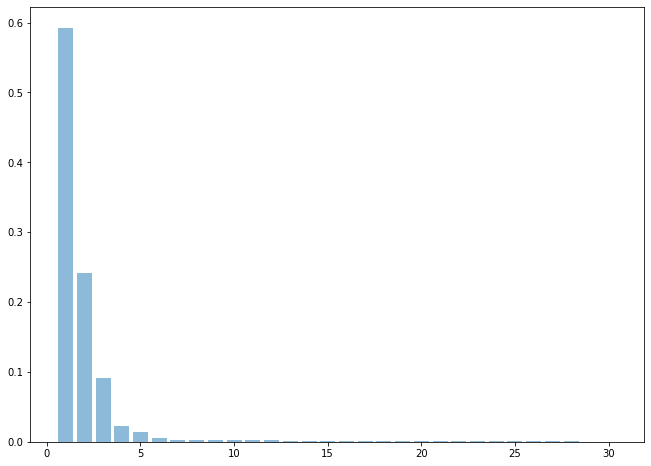

In [74]:
ax = plt.bar(np.arange(1,31),pca.explained_variance_ratio_,alpha=0.5, align='center')
for container in ax.containers:
    ax.bar_label(container)

plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

In [75]:
# from the above graph we can see 6 pca are enough to explan max vrations

pca = PCA(n_components = 6)
pca_df = pd.DataFrame(pca.fit_transform(X_imputed))
pca_df

,0,1,2,3,4,5
0,-5180.105331,-3019.660809,688.535728,57.979050,349.832775,-40.978470
1,-1863.131137,-4019.342340,-1505.440451,199.255068,-639.854807,-45.609176
2,-3150.992486,-3459.545857,-1855.452528,-153.461617,-138.868924,-29.582183
3,-1979.075881,-596.057356,-1509.152198,-572.256874,286.561590,-67.942357
4,-3922.130405,-2341.192130,134.702127,-188.023420,-133.755851,-54.408746
...,...,...,...,...,...,...
1562,-4530.719756,3375.814858,321.142209,-2037.140217,1587.529657,-66.088932
1563,-5194.155598,-3818.636596,300.494199,-127.392045,-776.286110,-49.589051
1564,-3817.158109,-154.764822,-1198.467584,-15.581329,481.185713,-53.869568
1565,-4267.237884,-1297.481110,381.586480,299.162705,758.087977,-50.769219


In [76]:
X_train,X_test,y_train,y_test = train_test_split(pca_df,y,test_size = 0.2,random_state = 1)

In [77]:
models = [lr,svc,rf,gnb,dt,ab,bc,gb,xgb,cat,lgbm]
model_names = ['Logistic Regression','SVM','RandomForest','Naive Bayes','Decision Tree','Adaboost','BaggingClassifier',
              'gradientBoost','XgBoost','CatClassifier','lightGBM']

result_labels = ['train_accuracy','test_accuracy','f1','recall',' precision','Duration']

result = {}

for model,name in zip(models,model_names):
    result[name] = list(models_info(model,X_train,X_test,y_train,y_test)[:-1])

Learning rate set to 0.011344
0:	learn: 0.6792627	total: 2.79ms	remaining: 2.79s
1:	learn: 0.6661536	total: 5.45ms	remaining: 2.72s
2:	learn: 0.6535045	total: 8.48ms	remaining: 2.82s
3:	learn: 0.6408186	total: 11.3ms	remaining: 2.82s
4:	learn: 0.6292961	total: 13.9ms	remaining: 2.76s
5:	learn: 0.6180268	total: 16.6ms	remaining: 2.75s
6:	learn: 0.6070494	total: 19.2ms	remaining: 2.72s
7:	learn: 0.5963710	total: 22.2ms	remaining: 2.75s
8:	learn: 0.5860368	total: 25.1ms	remaining: 2.76s
9:	learn: 0.5761580	total: 27.8ms	remaining: 2.76s
10:	learn: 0.5665217	total: 30.4ms	remaining: 2.74s
11:	learn: 0.5570922	total: 33.4ms	remaining: 2.75s
12:	learn: 0.5476853	total: 36.2ms	remaining: 2.74s
13:	learn: 0.5388486	total: 38.8ms	remaining: 2.73s
14:	learn: 0.5299241	total: 41.6ms	remaining: 2.73s
15:	learn: 0.5209805	total: 44.5ms	remaining: 2.74s
16:	learn: 0.5130027	total: 47.2ms	remaining: 2.73s
17:	learn: 0.5049307	total: 49.9ms	remaining: 2.72s
18:	learn: 0.4970745	total: 52.6ms	remaining

202:	learn: 0.2094871	total: 527ms	remaining: 2.07s
203:	learn: 0.2092992	total: 530ms	remaining: 2.07s
204:	learn: 0.2091688	total: 532ms	remaining: 2.06s
205:	learn: 0.2090689	total: 535ms	remaining: 2.06s
206:	learn: 0.2088871	total: 538ms	remaining: 2.06s
207:	learn: 0.2085658	total: 541ms	remaining: 2.06s
208:	learn: 0.2082875	total: 543ms	remaining: 2.06s
209:	learn: 0.2080977	total: 546ms	remaining: 2.05s
210:	learn: 0.2078814	total: 549ms	remaining: 2.05s
211:	learn: 0.2076408	total: 552ms	remaining: 2.05s
212:	learn: 0.2074554	total: 554ms	remaining: 2.05s
213:	learn: 0.2072149	total: 557ms	remaining: 2.05s
214:	learn: 0.2070589	total: 560ms	remaining: 2.04s
215:	learn: 0.2067191	total: 563ms	remaining: 2.04s
216:	learn: 0.2066109	total: 566ms	remaining: 2.04s
217:	learn: 0.2064542	total: 569ms	remaining: 2.04s
218:	learn: 0.2063057	total: 571ms	remaining: 2.04s
219:	learn: 0.2060810	total: 573ms	remaining: 2.03s
220:	learn: 0.2059001	total: 576ms	remaining: 2.03s
221:	learn: 

399:	learn: 0.1772513	total: 1.05s	remaining: 1.58s
400:	learn: 0.1771083	total: 1.05s	remaining: 1.57s
401:	learn: 0.1770016	total: 1.06s	remaining: 1.57s
402:	learn: 0.1768766	total: 1.06s	remaining: 1.57s
403:	learn: 0.1767431	total: 1.06s	remaining: 1.56s
404:	learn: 0.1766283	total: 1.06s	remaining: 1.56s
405:	learn: 0.1764751	total: 1.07s	remaining: 1.56s
406:	learn: 0.1763478	total: 1.07s	remaining: 1.56s
407:	learn: 0.1762241	total: 1.07s	remaining: 1.55s
408:	learn: 0.1760344	total: 1.07s	remaining: 1.55s
409:	learn: 0.1758898	total: 1.08s	remaining: 1.55s
410:	learn: 0.1756175	total: 1.08s	remaining: 1.55s
411:	learn: 0.1754899	total: 1.08s	remaining: 1.54s
412:	learn: 0.1753420	total: 1.08s	remaining: 1.54s
413:	learn: 0.1751248	total: 1.09s	remaining: 1.54s
414:	learn: 0.1749392	total: 1.09s	remaining: 1.53s
415:	learn: 0.1748312	total: 1.09s	remaining: 1.53s
416:	learn: 0.1746891	total: 1.09s	remaining: 1.53s
417:	learn: 0.1745825	total: 1.1s	remaining: 1.53s
418:	learn: 0

633:	learn: 0.1468388	total: 1.56s	remaining: 903ms
634:	learn: 0.1466945	total: 1.56s	remaining: 900ms
635:	learn: 0.1465367	total: 1.57s	remaining: 897ms
636:	learn: 0.1463667	total: 1.57s	remaining: 895ms
637:	learn: 0.1462335	total: 1.57s	remaining: 892ms
638:	learn: 0.1461221	total: 1.57s	remaining: 889ms
639:	learn: 0.1460613	total: 1.58s	remaining: 887ms
640:	learn: 0.1460065	total: 1.58s	remaining: 884ms
641:	learn: 0.1458614	total: 1.58s	remaining: 881ms
642:	learn: 0.1457712	total: 1.58s	remaining: 879ms
643:	learn: 0.1456756	total: 1.58s	remaining: 876ms
644:	learn: 0.1456049	total: 1.59s	remaining: 873ms
645:	learn: 0.1455302	total: 1.59s	remaining: 871ms
646:	learn: 0.1454642	total: 1.59s	remaining: 868ms
647:	learn: 0.1453401	total: 1.59s	remaining: 865ms
648:	learn: 0.1451415	total: 1.59s	remaining: 863ms
649:	learn: 0.1450689	total: 1.6s	remaining: 860ms
650:	learn: 0.1449935	total: 1.6s	remaining: 857ms
651:	learn: 0.1449250	total: 1.6s	remaining: 855ms
652:	learn: 0.1

810:	learn: 0.1299526	total: 1.91s	remaining: 446ms
811:	learn: 0.1298825	total: 1.92s	remaining: 444ms
812:	learn: 0.1298147	total: 1.92s	remaining: 441ms
813:	learn: 0.1297172	total: 1.92s	remaining: 439ms
814:	learn: 0.1295866	total: 1.92s	remaining: 436ms
815:	learn: 0.1294898	total: 1.92s	remaining: 434ms
816:	learn: 0.1294034	total: 1.93s	remaining: 431ms
817:	learn: 0.1293202	total: 1.93s	remaining: 429ms
818:	learn: 0.1292443	total: 1.93s	remaining: 426ms
819:	learn: 0.1291389	total: 1.93s	remaining: 424ms
820:	learn: 0.1291078	total: 1.93s	remaining: 422ms
821:	learn: 0.1289662	total: 1.94s	remaining: 419ms
822:	learn: 0.1288916	total: 1.94s	remaining: 417ms
823:	learn: 0.1287806	total: 1.94s	remaining: 414ms
824:	learn: 0.1286659	total: 1.94s	remaining: 412ms
825:	learn: 0.1285664	total: 1.94s	remaining: 409ms
826:	learn: 0.1284554	total: 1.94s	remaining: 407ms
827:	learn: 0.1282546	total: 1.95s	remaining: 404ms
828:	learn: 0.1281953	total: 1.95s	remaining: 402ms
829:	learn: 

In [78]:
pca_result_df = pd.DataFrame(result.values(),columns = result_labels,index = result.keys() )
pca_result_df

,train_accuracy,test_accuracy,f1,recall,precision,Duration
Logistic Regression,0.932961,0.936306,0.000000,0.00,0.00,0.032014
SVM,0.932961,0.936306,0.000000,0.00,0.00,0.398018
RandomForest,1.000000,0.936306,0.000000,0.00,0.00,0.512467
Naive Bayes,0.919393,0.920382,0.000000,0.00,0.00,0.016020
Decision Tree,0.945730,0.923567,0.076923,0.05,0.05,0.009211
Adaboost,1.000000,0.936306,0.000000,0.00,0.00,0.500947
BaggingClassifier,0.941740,0.936306,0.000000,0.00,0.00,0.087638
gradientBoost,0.957702,0.936306,0.000000,0.00,0.00,0.393490
XgBoost,1.000000,0.933121,0.000000,0.00,0.00,0.211125
CatClassifier,0.950519,0.936306,0.000000,0.00,0.00,2.502347


In [93]:
print(models)

[LogisticRegression(), SVC(probability=True), RandomForestClassifier(), GaussianNB(), DecisionTreeClassifier(max_depth=8), AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=8)), BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=8)), GradientBoostingClassifier(), XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=12,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None), <catboost.core.CatBoostClassifier object at 0x0000013F4E15F160>,

In [95]:
#hlr,_,hrf,hgb,hdt,hab,hbc,hgb,hxgb,hcat,hlgbm = np.arange(0,10)
hlr,_,hrf,hgb,hdt,hab,hbc,hgb,hxgb,hcat,hlgbm = (model for model in models)
for i,model in enumerate([hlr,hrf,hgb,hdt,hab,hbc,hgb,hxgb,hcat,hlgbm]):
    model = models[i]

In [96]:
hrf

RandomForestClassifier()

In [98]:
models = [hlr,hrf,hgb,hdt,hab,hbc,hgb,hxgb,hcat,hlgbm]
model_names = ['Logistic Regression','RandomForest','Naive Bayes','Decision Tree','Adaboost','BaggingClassifier',
              'gradientBoost','XgBoost','CatClassifier','lightGBM']

result_labels = ['train_accuracy','test_accuracy','f1','recall',' precision','Duration']

result = {}

for model,name in zip(models,model_names):
    result[name] = list(models_info(model,X_train,X_test,y_train,y_test)[:-1])

Learning rate set to 0.011344
0:	learn: 0.6792627	total: 1.68ms	remaining: 1.68s
1:	learn: 0.6661536	total: 3.31ms	remaining: 1.65s
2:	learn: 0.6535045	total: 4.82ms	remaining: 1.6s
3:	learn: 0.6408186	total: 6.37ms	remaining: 1.58s
4:	learn: 0.6292961	total: 7.87ms	remaining: 1.57s
5:	learn: 0.6180268	total: 9.42ms	remaining: 1.56s
6:	learn: 0.6070494	total: 11.2ms	remaining: 1.59s
7:	learn: 0.5963710	total: 12.8ms	remaining: 1.59s
8:	learn: 0.5860368	total: 14.4ms	remaining: 1.58s
9:	learn: 0.5761580	total: 15.9ms	remaining: 1.57s
10:	learn: 0.5665217	total: 17.4ms	remaining: 1.57s
11:	learn: 0.5570922	total: 19ms	remaining: 1.56s
12:	learn: 0.5476853	total: 20.5ms	remaining: 1.56s
13:	learn: 0.5388486	total: 22ms	remaining: 1.55s
14:	learn: 0.5299241	total: 23.5ms	remaining: 1.54s
15:	learn: 0.5209805	total: 25ms	remaining: 1.54s
16:	learn: 0.5130027	total: 26.7ms	remaining: 1.54s
17:	learn: 0.5049307	total: 28.3ms	remaining: 1.54s
18:	learn: 0.4970745	total: 29.9ms	remaining: 1.54s

206:	learn: 0.2088871	total: 339ms	remaining: 1.3s
207:	learn: 0.2085658	total: 341ms	remaining: 1.3s
208:	learn: 0.2082875	total: 343ms	remaining: 1.3s
209:	learn: 0.2080977	total: 344ms	remaining: 1.29s
210:	learn: 0.2078814	total: 346ms	remaining: 1.29s
211:	learn: 0.2076408	total: 348ms	remaining: 1.29s
212:	learn: 0.2074554	total: 350ms	remaining: 1.29s
213:	learn: 0.2072149	total: 352ms	remaining: 1.29s
214:	learn: 0.2070589	total: 353ms	remaining: 1.29s
215:	learn: 0.2067191	total: 356ms	remaining: 1.29s
216:	learn: 0.2066109	total: 358ms	remaining: 1.29s
217:	learn: 0.2064542	total: 359ms	remaining: 1.29s
218:	learn: 0.2063057	total: 361ms	remaining: 1.29s
219:	learn: 0.2060810	total: 363ms	remaining: 1.29s
220:	learn: 0.2059001	total: 365ms	remaining: 1.29s
221:	learn: 0.2056205	total: 367ms	remaining: 1.28s
222:	learn: 0.2055086	total: 369ms	remaining: 1.28s
223:	learn: 0.2053927	total: 371ms	remaining: 1.28s
224:	learn: 0.2051948	total: 373ms	remaining: 1.28s
225:	learn: 0.2

424:	learn: 0.1733598	total: 699ms	remaining: 945ms
425:	learn: 0.1731710	total: 701ms	remaining: 944ms
426:	learn: 0.1730148	total: 702ms	remaining: 942ms
427:	learn: 0.1729046	total: 704ms	remaining: 941ms
428:	learn: 0.1727634	total: 706ms	remaining: 939ms
429:	learn: 0.1726403	total: 707ms	remaining: 938ms
430:	learn: 0.1725603	total: 709ms	remaining: 936ms
431:	learn: 0.1724119	total: 711ms	remaining: 935ms
432:	learn: 0.1722454	total: 713ms	remaining: 933ms
433:	learn: 0.1720781	total: 715ms	remaining: 932ms
434:	learn: 0.1719093	total: 716ms	remaining: 930ms
435:	learn: 0.1718360	total: 718ms	remaining: 929ms
436:	learn: 0.1717658	total: 720ms	remaining: 928ms
437:	learn: 0.1715150	total: 722ms	remaining: 926ms
438:	learn: 0.1713543	total: 724ms	remaining: 925ms
439:	learn: 0.1712674	total: 725ms	remaining: 923ms
440:	learn: 0.1710920	total: 727ms	remaining: 922ms
441:	learn: 0.1709102	total: 729ms	remaining: 920ms
442:	learn: 0.1706667	total: 731ms	remaining: 919ms
443:	learn: 

633:	learn: 0.1468388	total: 1.04s	remaining: 602ms
634:	learn: 0.1466945	total: 1.04s	remaining: 600ms
635:	learn: 0.1465367	total: 1.04s	remaining: 599ms
636:	learn: 0.1463667	total: 1.05s	remaining: 597ms
637:	learn: 0.1462335	total: 1.05s	remaining: 595ms
638:	learn: 0.1461221	total: 1.05s	remaining: 594ms
639:	learn: 0.1460613	total: 1.05s	remaining: 592ms
640:	learn: 0.1460065	total: 1.05s	remaining: 591ms
641:	learn: 0.1458614	total: 1.06s	remaining: 589ms
642:	learn: 0.1457712	total: 1.06s	remaining: 588ms
643:	learn: 0.1456756	total: 1.06s	remaining: 586ms
644:	learn: 0.1456049	total: 1.06s	remaining: 585ms
645:	learn: 0.1455302	total: 1.06s	remaining: 584ms
646:	learn: 0.1454642	total: 1.07s	remaining: 582ms
647:	learn: 0.1453401	total: 1.07s	remaining: 580ms
648:	learn: 0.1451415	total: 1.07s	remaining: 579ms
649:	learn: 0.1450689	total: 1.07s	remaining: 577ms
650:	learn: 0.1449935	total: 1.07s	remaining: 576ms
651:	learn: 0.1449250	total: 1.07s	remaining: 574ms
652:	learn: 

824:	learn: 0.1286659	total: 1.37s	remaining: 292ms
825:	learn: 0.1285664	total: 1.38s	remaining: 290ms
826:	learn: 0.1284554	total: 1.38s	remaining: 288ms
827:	learn: 0.1282546	total: 1.38s	remaining: 287ms
828:	learn: 0.1281953	total: 1.38s	remaining: 285ms
829:	learn: 0.1281229	total: 1.38s	remaining: 283ms
830:	learn: 0.1280054	total: 1.39s	remaining: 282ms
831:	learn: 0.1279339	total: 1.39s	remaining: 280ms
832:	learn: 0.1278333	total: 1.39s	remaining: 279ms
833:	learn: 0.1277875	total: 1.39s	remaining: 277ms
834:	learn: 0.1277165	total: 1.39s	remaining: 275ms
835:	learn: 0.1276725	total: 1.39s	remaining: 274ms
836:	learn: 0.1276410	total: 1.4s	remaining: 272ms
837:	learn: 0.1275960	total: 1.4s	remaining: 270ms
838:	learn: 0.1274959	total: 1.4s	remaining: 269ms
839:	learn: 0.1274327	total: 1.4s	remaining: 267ms
840:	learn: 0.1274025	total: 1.4s	remaining: 265ms
841:	learn: 0.1273191	total: 1.41s	remaining: 264ms
842:	learn: 0.1272493	total: 1.41s	remaining: 262ms
843:	learn: 0.127

In [99]:
pca_hyper_result_df = pd.DataFrame(result.values(),columns = result_labels,index = result.keys() )
pca_hyper_result_df

,train_accuracy,test_accuracy,f1,recall,precision,Duration
Logistic Regression,0.932961,0.936306,0.000000,0.00,0.00,0.017995
RandomForest,1.000000,0.936306,0.000000,0.00,0.00,0.251113
Naive Bayes,0.957702,0.936306,0.000000,0.00,0.00,0.204340
Decision Tree,0.945730,0.923567,0.076923,0.05,0.05,0.015648
Adaboost,1.000000,0.933121,0.000000,0.00,0.00,0.280519
BaggingClassifier,0.938547,0.936306,0.000000,0.00,0.00,0.050299
gradientBoost,0.957702,0.936306,0.000000,0.00,0.00,0.217989
XgBoost,1.000000,0.933121,0.000000,0.00,0.00,0.104245
CatClassifier,0.950519,0.936306,0.000000,0.00,0.00,1.926100
lightGBM,1.000000,0.936306,0.000000,0.00,0.00,0.097022


In [100]:
smote = SMOTE(random_state = 1)

X_train,y_train = smote.fit_resample(X_train,y_train)

In [101]:
models = [lr,svc,rf,gnb,dt,ab,bc,gb,xgb,cat,lgbm]
model_names = ['Logistic Regression','SVM','RandomForest','Naive Bayes','Decision Tree','Adaboost','BaggingClassifier',
              'gradientBoost','XgBoost','CatClassifier','lightGBM']

result_labels = ['train_accuracy','test_accuracy','f1','recall',' precision','Duration']

result = {}

for model,name in zip(models,model_names):
    result[name] = list(models_info(model,X_train,X_test,y_train,y_test)[:-1])

Learning rate set to 0.014806
0:	learn: 0.6912602	total: 2.6ms	remaining: 2.59s
1:	learn: 0.6895346	total: 5.16ms	remaining: 2.57s
2:	learn: 0.6872683	total: 7.74ms	remaining: 2.57s
3:	learn: 0.6846007	total: 10.5ms	remaining: 2.62s
4:	learn: 0.6825648	total: 13.2ms	remaining: 2.62s
5:	learn: 0.6806727	total: 15.8ms	remaining: 2.62s
6:	learn: 0.6783979	total: 18.9ms	remaining: 2.68s
7:	learn: 0.6765343	total: 21.3ms	remaining: 2.64s
8:	learn: 0.6747488	total: 24ms	remaining: 2.65s
9:	learn: 0.6727913	total: 27ms	remaining: 2.67s
10:	learn: 0.6705141	total: 29.8ms	remaining: 2.68s
11:	learn: 0.6682776	total: 32.3ms	remaining: 2.66s
12:	learn: 0.6664511	total: 35ms	remaining: 2.65s
13:	learn: 0.6645300	total: 37.5ms	remaining: 2.64s
14:	learn: 0.6628756	total: 40.1ms	remaining: 2.63s
15:	learn: 0.6601385	total: 42.7ms	remaining: 2.63s
16:	learn: 0.6579376	total: 45.5ms	remaining: 2.63s
17:	learn: 0.6562482	total: 48.1ms	remaining: 2.62s
18:	learn: 0.6546232	total: 50.6ms	remaining: 2.61s

227:	learn: 0.4670389	total: 503ms	remaining: 1.7s
228:	learn: 0.4665205	total: 505ms	remaining: 1.7s
229:	learn: 0.4658503	total: 507ms	remaining: 1.7s
230:	learn: 0.4653946	total: 516ms	remaining: 1.72s
231:	learn: 0.4647656	total: 519ms	remaining: 1.72s
232:	learn: 0.4643103	total: 521ms	remaining: 1.72s
233:	learn: 0.4639694	total: 523ms	remaining: 1.71s
234:	learn: 0.4631508	total: 526ms	remaining: 1.71s
235:	learn: 0.4626541	total: 528ms	remaining: 1.71s
236:	learn: 0.4620049	total: 530ms	remaining: 1.7s
237:	learn: 0.4612848	total: 531ms	remaining: 1.7s
238:	learn: 0.4605523	total: 534ms	remaining: 1.7s
239:	learn: 0.4598121	total: 536ms	remaining: 1.7s
240:	learn: 0.4591863	total: 538ms	remaining: 1.69s
241:	learn: 0.4588500	total: 540ms	remaining: 1.69s
242:	learn: 0.4581380	total: 543ms	remaining: 1.69s
243:	learn: 0.4576915	total: 545ms	remaining: 1.69s
244:	learn: 0.4570800	total: 548ms	remaining: 1.69s
245:	learn: 0.4565954	total: 550ms	remaining: 1.69s
246:	learn: 0.45637

402:	learn: 0.3870859	total: 848ms	remaining: 1.26s
403:	learn: 0.3866557	total: 850ms	remaining: 1.25s
404:	learn: 0.3861658	total: 852ms	remaining: 1.25s
405:	learn: 0.3857797	total: 854ms	remaining: 1.25s
406:	learn: 0.3854265	total: 856ms	remaining: 1.25s
407:	learn: 0.3850849	total: 858ms	remaining: 1.25s
408:	learn: 0.3842450	total: 860ms	remaining: 1.24s
409:	learn: 0.3839972	total: 863ms	remaining: 1.24s
410:	learn: 0.3837399	total: 865ms	remaining: 1.24s
411:	learn: 0.3831132	total: 867ms	remaining: 1.24s
412:	learn: 0.3826388	total: 869ms	remaining: 1.23s
413:	learn: 0.3823086	total: 870ms	remaining: 1.23s
414:	learn: 0.3820611	total: 872ms	remaining: 1.23s
415:	learn: 0.3814740	total: 874ms	remaining: 1.23s
416:	learn: 0.3811498	total: 876ms	remaining: 1.22s
417:	learn: 0.3807239	total: 878ms	remaining: 1.22s
418:	learn: 0.3803382	total: 880ms	remaining: 1.22s
419:	learn: 0.3801242	total: 882ms	remaining: 1.22s
420:	learn: 0.3799295	total: 883ms	remaining: 1.21s
421:	learn: 

581:	learn: 0.3263288	total: 1.2s	remaining: 859ms
582:	learn: 0.3259467	total: 1.2s	remaining: 857ms
583:	learn: 0.3257101	total: 1.2s	remaining: 855ms
584:	learn: 0.3254753	total: 1.2s	remaining: 853ms
585:	learn: 0.3251962	total: 1.21s	remaining: 851ms
586:	learn: 0.3249895	total: 1.21s	remaining: 849ms
587:	learn: 0.3247619	total: 1.21s	remaining: 847ms
588:	learn: 0.3245182	total: 1.21s	remaining: 845ms
589:	learn: 0.3243196	total: 1.21s	remaining: 843ms
590:	learn: 0.3239979	total: 1.22s	remaining: 841ms
591:	learn: 0.3235037	total: 1.22s	remaining: 839ms
592:	learn: 0.3231646	total: 1.22s	remaining: 838ms
593:	learn: 0.3229454	total: 1.22s	remaining: 836ms
594:	learn: 0.3227003	total: 1.22s	remaining: 834ms
595:	learn: 0.3224464	total: 1.23s	remaining: 832ms
596:	learn: 0.3220811	total: 1.23s	remaining: 829ms
597:	learn: 0.3218056	total: 1.23s	remaining: 827ms
598:	learn: 0.3212951	total: 1.23s	remaining: 825ms
599:	learn: 0.3210702	total: 1.23s	remaining: 823ms
600:	learn: 0.32

758:	learn: 0.2773998	total: 1.55s	remaining: 492ms
759:	learn: 0.2771368	total: 1.55s	remaining: 490ms
760:	learn: 0.2767116	total: 1.55s	remaining: 488ms
761:	learn: 0.2765421	total: 1.55s	remaining: 486ms
762:	learn: 0.2763607	total: 1.56s	remaining: 484ms
763:	learn: 0.2759513	total: 1.56s	remaining: 482ms
764:	learn: 0.2758094	total: 1.56s	remaining: 480ms
765:	learn: 0.2755619	total: 1.56s	remaining: 478ms
766:	learn: 0.2752764	total: 1.57s	remaining: 476ms
767:	learn: 0.2750370	total: 1.57s	remaining: 474ms
768:	learn: 0.2748268	total: 1.57s	remaining: 472ms
769:	learn: 0.2746490	total: 1.57s	remaining: 471ms
770:	learn: 0.2744817	total: 1.58s	remaining: 469ms
771:	learn: 0.2743351	total: 1.58s	remaining: 467ms
772:	learn: 0.2741534	total: 1.58s	remaining: 465ms
773:	learn: 0.2736395	total: 1.58s	remaining: 463ms
774:	learn: 0.2733391	total: 1.59s	remaining: 461ms
775:	learn: 0.2731272	total: 1.59s	remaining: 459ms
776:	learn: 0.2727629	total: 1.59s	remaining: 457ms
777:	learn: 

998:	learn: 0.2239965	total: 2.07s	remaining: 2.07ms
999:	learn: 0.2238246	total: 2.07s	remaining: 0us


In [102]:
pca_hyper_result_df = pd.DataFrame(result.values(),columns = result_labels,index = result.keys() )
pca_hyper_result_df

,train_accuracy,test_accuracy,f1,recall,precision,Duration
Logistic Regression,0.591104,0.445860,0.093750,0.45,0.45,0.013002
SVM,0.699743,0.509554,0.114943,0.50,0.50,1.677549
RandomForest,1.000000,0.863057,0.085106,0.10,0.10,0.483465
Naive Bayes,0.592814,0.684713,0.139130,0.40,0.40,0.000000
Decision Tree,0.748931,0.506369,0.114286,0.50,0.50,0.015633
Adaboost,1.000000,0.894904,0.195122,0.20,0.20,0.517764
BaggingClassifier,0.846450,0.684713,0.091743,0.25,0.25,0.062907
gradientBoost,0.843028,0.726115,0.140000,0.35,0.35,0.405742
XgBoost,1.000000,0.866242,0.125000,0.15,0.15,0.175040
CatClassifier,0.959367,0.831210,0.070175,0.10,0.10,2.316386


### conclusions
1. No model is performing great because there is no correct way to select the columns thare imp
2. Tried various ways for selecting columns still no good results
3. performed hypertuing still no good results
4. Handling imbalance using upsampling  did give good results
5. downsampling didnt try
6. used Pca of 5 components still no imporvements
7. over all when hypertuneed Logistic Regressing is performing well than all other models

In [123]:
# pickling logistic regression  
saved_model = pickle.dump(hlr,open('saved_model.pkl','wb'))

In [117]:
#plz share NotebOOk for refence for this kind of problem 